# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

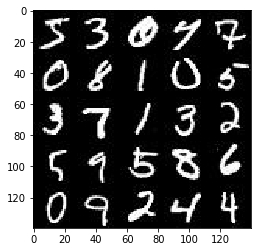

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

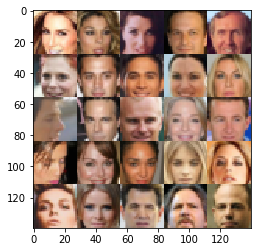

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [51]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], 'real_input_images')
    z_data = tf.placeholder(tf.float32, [None, z_dim], 'z_data')
    learning_rate = tf.placeholder(tf.float32, name = 'learning_rate')
    
    return real_input, z_data, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [124]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse = reuse):
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 56, 5, strides = 2, padding = 'same')
        relu1 = leaky_relu(x1, 0.1)
        # 14x14x56
        
        x2 = tf.layers.conv2d(relu1, 112, 5, strides = 2, padding = 'same')
        bn2 = tf.layers.batch_normalization(x2, training = True)
        relu2 = leaky_relu(bn2, 0.1)
        # 7x7x112
        
        x3 = tf.layers.conv2d(relu2, 224, 5, strides = 2, padding = 'same')
        bn3 = tf.layers.batch_normalization(x3, training = True)
        relu3 = leaky_relu(bn3, 0.1)
        # 4x4x224

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4 * 4 * 224))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

def leaky_relu(layer, alpha):
    return tf.maximum(alpha * layer, layer)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [125]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse = not(is_train)):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7 * 7 * 112)
        
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 112))
        x1 = tf.layers.batch_normalization(x1, training = is_train)
        x1 = leaky_relu(x1, 0.1)
        # 7x7x112 now
        
        x2 = tf.layers.conv2d_transpose(x1, 56, 5, strides = 2, padding = 'same')
        x2 = tf.layers.batch_normalization(x2, training = is_train)
        x2 = leaky_relu(x2, 0.1)
        # 14x14x56 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 5, strides = 2, padding = 'same')
        # 28x28x3 now
        
        out = tf.tanh(logits)
        
        return out
    
    return None


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [126]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse = True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_real, labels = tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_fake, labels = tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_fake, labels = tf.ones_like(d_model_fake)))
    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [127]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(d_loss, var_list = d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(g_loss, var_list = g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [128]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [131]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    steps = 0
    print_every = 10
    show_every = 50
    
    input_real, input_z, model_learning_rate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                
                # Normalize input (-1, 1)
                batch_images = batch_images * 2
                
                # Input noise
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run discriminator and generator optimizers
                _ = sess.run(d_opt, feed_dict={ input_real: batch_images, input_z: batch_z, model_learning_rate: learning_rate })
                _ = sess.run(g_opt, feed_dict={ input_real: batch_images, input_z: batch_z, model_learning_rate: learning_rate })
            
                # Status infos
                if steps % print_every == 0:
                    train_loss_d = d_loss.eval(feed_dict={ input_z: batch_z, input_real: batch_images })
                    train_loss_g = g_loss.eval(feed_dict={ input_z: batch_z })
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, batch_size, input_z, data_shape[3], data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.0724... Generator Loss: 2.8629
Epoch 1/2... Discriminator Loss: 0.0436... Generator Loss: 3.7019
Epoch 1/2... Discriminator Loss: 0.0604... Generator Loss: 4.6005
Epoch 1/2... Discriminator Loss: 0.0902... Generator Loss: 3.5818
Epoch 1/2... Discriminator Loss: 0.2615... Generator Loss: 1.9291


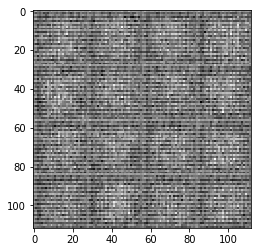

Epoch 1/2... Discriminator Loss: 0.3093... Generator Loss: 1.9091
Epoch 1/2... Discriminator Loss: 0.1774... Generator Loss: 2.5700
Epoch 1/2... Discriminator Loss: 0.3033... Generator Loss: 13.2063
Epoch 1/2... Discriminator Loss: 0.1345... Generator Loss: 3.1102
Epoch 1/2... Discriminator Loss: 0.0722... Generator Loss: 3.8316


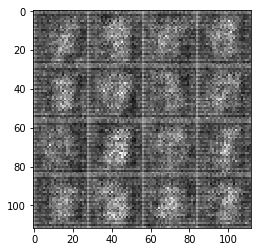

Epoch 1/2... Discriminator Loss: 0.2051... Generator Loss: 2.6124
Epoch 1/2... Discriminator Loss: 0.3408... Generator Loss: 1.9846
Epoch 1/2... Discriminator Loss: 10.5563... Generator Loss: 0.0003
Epoch 1/2... Discriminator Loss: 0.2310... Generator Loss: 2.3945
Epoch 1/2... Discriminator Loss: 0.3716... Generator Loss: 1.5549


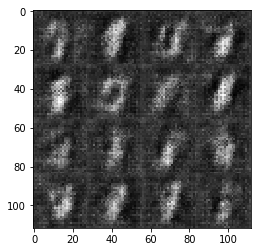

Epoch 1/2... Discriminator Loss: 0.2126... Generator Loss: 3.1225
Epoch 1/2... Discriminator Loss: 0.1705... Generator Loss: 3.0962
Epoch 1/2... Discriminator Loss: 0.2349... Generator Loss: 2.5646
Epoch 1/2... Discriminator Loss: 0.2307... Generator Loss: 2.2411
Epoch 1/2... Discriminator Loss: 0.6012... Generator Loss: 1.2922


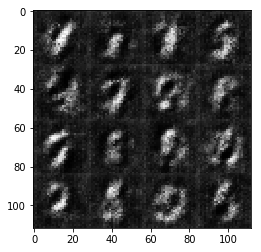

Epoch 1/2... Discriminator Loss: 0.2607... Generator Loss: 2.1687
Epoch 1/2... Discriminator Loss: 0.7714... Generator Loss: 1.0045
Epoch 1/2... Discriminator Loss: 0.2205... Generator Loss: 2.5511
Epoch 1/2... Discriminator Loss: 0.2593... Generator Loss: 2.0333
Epoch 1/2... Discriminator Loss: 0.3269... Generator Loss: 1.8306


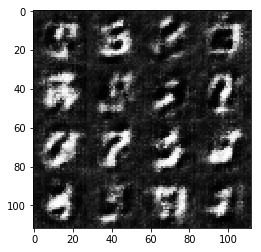

Epoch 1/2... Discriminator Loss: 0.3427... Generator Loss: 3.4856
Epoch 1/2... Discriminator Loss: 0.2184... Generator Loss: 3.4549
Epoch 1/2... Discriminator Loss: 0.8064... Generator Loss: 0.8730
Epoch 1/2... Discriminator Loss: 0.1638... Generator Loss: 2.8823
Epoch 1/2... Discriminator Loss: 0.3752... Generator Loss: 1.4421


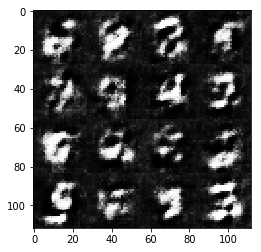

Epoch 1/2... Discriminator Loss: 0.2776... Generator Loss: 2.0501
Epoch 1/2... Discriminator Loss: 0.2479... Generator Loss: 2.1501
Epoch 1/2... Discriminator Loss: 0.2120... Generator Loss: 3.0838
Epoch 1/2... Discriminator Loss: 0.3095... Generator Loss: 2.7556
Epoch 1/2... Discriminator Loss: 0.1529... Generator Loss: 2.6443


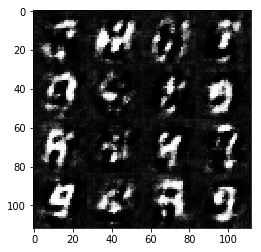

Epoch 1/2... Discriminator Loss: 0.3719... Generator Loss: 3.1564
Epoch 1/2... Discriminator Loss: 0.1944... Generator Loss: 2.4082
Epoch 1/2... Discriminator Loss: 0.2572... Generator Loss: 2.4708
Epoch 1/2... Discriminator Loss: 0.1823... Generator Loss: 2.3938
Epoch 1/2... Discriminator Loss: 0.2040... Generator Loss: 2.6993


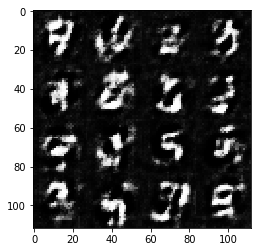

Epoch 1/2... Discriminator Loss: 0.5676... Generator Loss: 1.1277
Epoch 1/2... Discriminator Loss: 0.9430... Generator Loss: 0.5899
Epoch 1/2... Discriminator Loss: 0.2655... Generator Loss: 1.8504
Epoch 1/2... Discriminator Loss: 0.1197... Generator Loss: 4.1428
Epoch 1/2... Discriminator Loss: 0.2699... Generator Loss: 1.9980


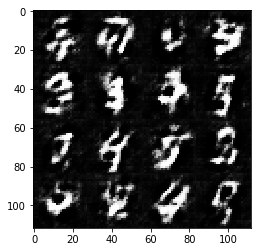

Epoch 1/2... Discriminator Loss: 0.2378... Generator Loss: 2.1925
Epoch 1/2... Discriminator Loss: 0.3065... Generator Loss: 1.9432
Epoch 1/2... Discriminator Loss: 0.2485... Generator Loss: 2.2529
Epoch 1/2... Discriminator Loss: 0.4148... Generator Loss: 1.5034
Epoch 1/2... Discriminator Loss: 0.2164... Generator Loss: 3.4825


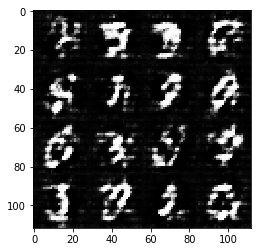

Epoch 1/2... Discriminator Loss: 0.2318... Generator Loss: 2.8700
Epoch 1/2... Discriminator Loss: 0.1209... Generator Loss: 3.0103
Epoch 1/2... Discriminator Loss: 0.1083... Generator Loss: 3.5036
Epoch 1/2... Discriminator Loss: 0.3791... Generator Loss: 3.2230
Epoch 1/2... Discriminator Loss: 0.3312... Generator Loss: 1.7454


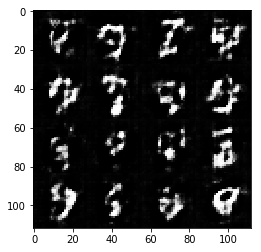

Epoch 1/2... Discriminator Loss: 0.1316... Generator Loss: 2.6558
Epoch 1/2... Discriminator Loss: 0.2608... Generator Loss: 2.2693
Epoch 1/2... Discriminator Loss: 0.5069... Generator Loss: 1.2533
Epoch 1/2... Discriminator Loss: 0.3903... Generator Loss: 1.3859
Epoch 1/2... Discriminator Loss: 0.9545... Generator Loss: 0.6727


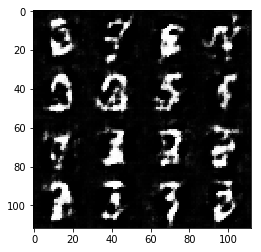

Epoch 1/2... Discriminator Loss: 0.2721... Generator Loss: 1.8940
Epoch 1/2... Discriminator Loss: 0.1388... Generator Loss: 2.8404
Epoch 1/2... Discriminator Loss: 0.1544... Generator Loss: 3.2742
Epoch 1/2... Discriminator Loss: 0.7527... Generator Loss: 0.9116
Epoch 1/2... Discriminator Loss: 0.2549... Generator Loss: 2.2456


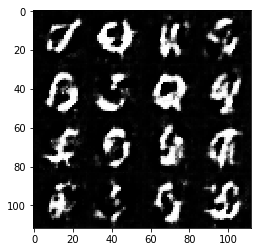

Epoch 1/2... Discriminator Loss: 0.3292... Generator Loss: 3.0669
Epoch 1/2... Discriminator Loss: 0.2077... Generator Loss: 2.3776
Epoch 1/2... Discriminator Loss: 0.3657... Generator Loss: 1.8093
Epoch 1/2... Discriminator Loss: 0.2066... Generator Loss: 2.6173
Epoch 1/2... Discriminator Loss: 0.3695... Generator Loss: 1.4329


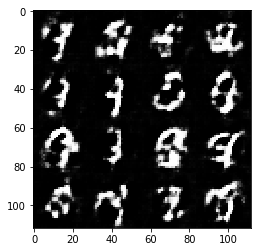

Epoch 1/2... Discriminator Loss: 0.9901... Generator Loss: 0.5848
Epoch 1/2... Discriminator Loss: 0.3465... Generator Loss: 1.8412
Epoch 1/2... Discriminator Loss: 0.4338... Generator Loss: 1.5202
Epoch 1/2... Discriminator Loss: 0.1923... Generator Loss: 3.1549
Epoch 1/2... Discriminator Loss: 0.9533... Generator Loss: 0.7557


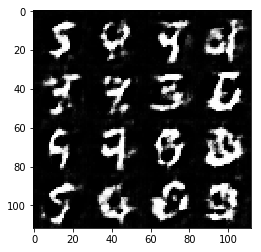

Epoch 1/2... Discriminator Loss: 0.2373... Generator Loss: 2.3897
Epoch 1/2... Discriminator Loss: 0.2092... Generator Loss: 2.4508
Epoch 1/2... Discriminator Loss: 0.1348... Generator Loss: 3.3307
Epoch 1/2... Discriminator Loss: 0.0959... Generator Loss: 3.3562
Epoch 1/2... Discriminator Loss: 0.1948... Generator Loss: 2.6601


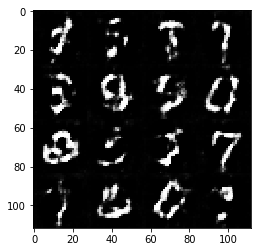

Epoch 1/2... Discriminator Loss: 0.3534... Generator Loss: 1.3919
Epoch 1/2... Discriminator Loss: 0.5887... Generator Loss: 7.2017
Epoch 1/2... Discriminator Loss: 0.2841... Generator Loss: 2.3583
Epoch 1/2... Discriminator Loss: 0.0804... Generator Loss: 3.5929
Epoch 1/2... Discriminator Loss: 0.5289... Generator Loss: 1.2328


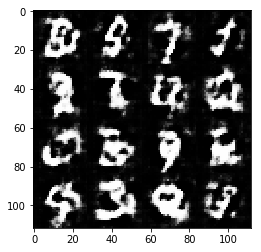

Epoch 1/2... Discriminator Loss: 0.7860... Generator Loss: 1.0113
Epoch 1/2... Discriminator Loss: 0.5754... Generator Loss: 4.0518
Epoch 1/2... Discriminator Loss: 0.2858... Generator Loss: 3.7995
Epoch 1/2... Discriminator Loss: 0.2525... Generator Loss: 2.3117
Epoch 1/2... Discriminator Loss: 0.2543... Generator Loss: 2.5518


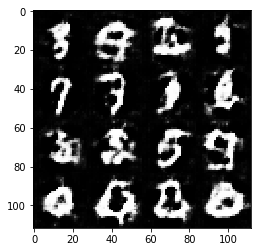

Epoch 1/2... Discriminator Loss: 0.1707... Generator Loss: 3.1396
Epoch 1/2... Discriminator Loss: 0.2329... Generator Loss: 2.8085
Epoch 1/2... Discriminator Loss: 0.2923... Generator Loss: 2.2520
Epoch 1/2... Discriminator Loss: 0.1941... Generator Loss: 2.5692
Epoch 1/2... Discriminator Loss: 0.2407... Generator Loss: 2.3231


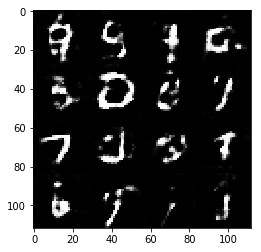

Epoch 1/2... Discriminator Loss: 0.7370... Generator Loss: 0.9208
Epoch 1/2... Discriminator Loss: 0.2227... Generator Loss: 2.4704
Epoch 1/2... Discriminator Loss: 1.0978... Generator Loss: 0.6841
Epoch 1/2... Discriminator Loss: 0.3177... Generator Loss: 3.2618
Epoch 1/2... Discriminator Loss: 0.0830... Generator Loss: 4.7365


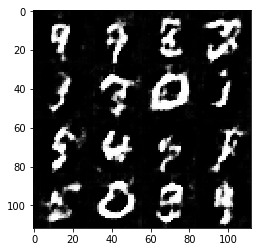

Epoch 1/2... Discriminator Loss: 0.2113... Generator Loss: 2.5236
Epoch 1/2... Discriminator Loss: 0.3634... Generator Loss: 1.5946
Epoch 1/2... Discriminator Loss: 0.3931... Generator Loss: 1.6164
Epoch 1/2... Discriminator Loss: 0.2510... Generator Loss: 1.9359
Epoch 1/2... Discriminator Loss: 0.2870... Generator Loss: 2.7163


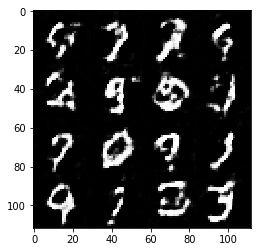

Epoch 1/2... Discriminator Loss: 0.1590... Generator Loss: 3.1443
Epoch 1/2... Discriminator Loss: 0.2303... Generator Loss: 1.9103
Epoch 1/2... Discriminator Loss: 0.2430... Generator Loss: 2.5873
Epoch 1/2... Discriminator Loss: 0.1173... Generator Loss: 3.4591
Epoch 1/2... Discriminator Loss: 0.2717... Generator Loss: 3.1437


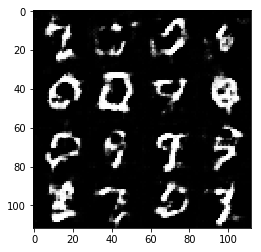

Epoch 1/2... Discriminator Loss: 0.7325... Generator Loss: 1.2419
Epoch 1/2... Discriminator Loss: 0.2403... Generator Loss: 2.4872
Epoch 1/2... Discriminator Loss: 0.5998... Generator Loss: 1.1440
Epoch 1/2... Discriminator Loss: 0.2314... Generator Loss: 2.0746
Epoch 1/2... Discriminator Loss: 0.2749... Generator Loss: 1.9038


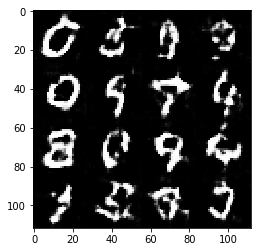

Epoch 1/2... Discriminator Loss: 0.1511... Generator Loss: 3.8423
Epoch 1/2... Discriminator Loss: 0.2975... Generator Loss: 2.3263
Epoch 1/2... Discriminator Loss: 0.3057... Generator Loss: 1.8155
Epoch 1/2... Discriminator Loss: 0.2802... Generator Loss: 2.3462
Epoch 1/2... Discriminator Loss: 0.2559... Generator Loss: 1.8317


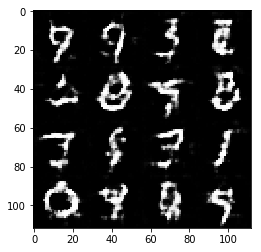

Epoch 1/2... Discriminator Loss: 0.1102... Generator Loss: 3.1960
Epoch 1/2... Discriminator Loss: 0.1364... Generator Loss: 2.7236
Epoch 1/2... Discriminator Loss: 0.1645... Generator Loss: 2.7986
Epoch 1/2... Discriminator Loss: 0.4415... Generator Loss: 1.2955
Epoch 1/2... Discriminator Loss: 0.3975... Generator Loss: 1.8211


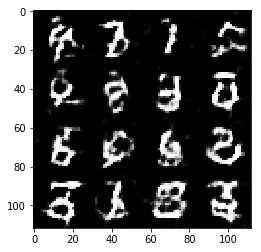

Epoch 1/2... Discriminator Loss: 0.2820... Generator Loss: 2.0668
Epoch 1/2... Discriminator Loss: 0.3850... Generator Loss: 3.2971
Epoch 1/2... Discriminator Loss: 0.3188... Generator Loss: 2.2058
Epoch 1/2... Discriminator Loss: 0.1537... Generator Loss: 3.5626
Epoch 1/2... Discriminator Loss: 0.4903... Generator Loss: 1.3707


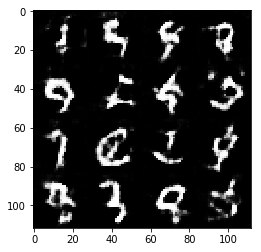

Epoch 1/2... Discriminator Loss: 0.1786... Generator Loss: 2.4042
Epoch 1/2... Discriminator Loss: 0.3010... Generator Loss: 2.4182
Epoch 1/2... Discriminator Loss: 0.2298... Generator Loss: 2.7986
Epoch 1/2... Discriminator Loss: 0.6626... Generator Loss: 1.0930
Epoch 1/2... Discriminator Loss: 0.5714... Generator Loss: 1.0100


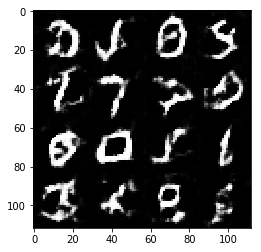

Epoch 1/2... Discriminator Loss: 0.2006... Generator Loss: 2.6293
Epoch 1/2... Discriminator Loss: 1.0724... Generator Loss: 0.5882
Epoch 1/2... Discriminator Loss: 1.4243... Generator Loss: 0.3651
Epoch 1/2... Discriminator Loss: 0.2917... Generator Loss: 2.0108
Epoch 1/2... Discriminator Loss: 0.4775... Generator Loss: 1.5119


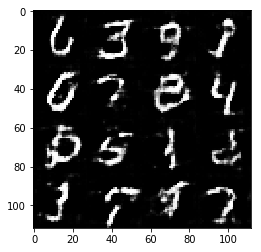

Epoch 1/2... Discriminator Loss: 0.4487... Generator Loss: 1.4415
Epoch 1/2... Discriminator Loss: 0.6405... Generator Loss: 1.1267
Epoch 1/2... Discriminator Loss: 0.6939... Generator Loss: 1.4913
Epoch 1/2... Discriminator Loss: 0.1916... Generator Loss: 2.3578
Epoch 1/2... Discriminator Loss: 0.7408... Generator Loss: 0.9128


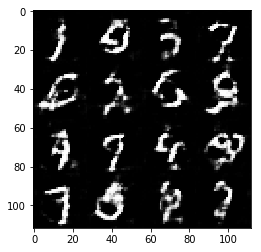

Epoch 1/2... Discriminator Loss: 0.2675... Generator Loss: 2.1768
Epoch 1/2... Discriminator Loss: 0.2471... Generator Loss: 2.0142
Epoch 1/2... Discriminator Loss: 0.4142... Generator Loss: 1.3597
Epoch 1/2... Discriminator Loss: 1.4216... Generator Loss: 0.4633
Epoch 1/2... Discriminator Loss: 0.4976... Generator Loss: 1.3879


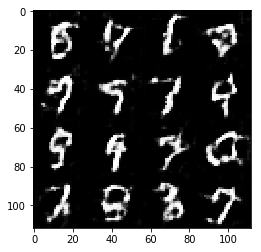

Epoch 1/2... Discriminator Loss: 0.3168... Generator Loss: 1.7470
Epoch 1/2... Discriminator Loss: 0.2699... Generator Loss: 2.4247
Epoch 1/2... Discriminator Loss: 0.9024... Generator Loss: 0.7770
Epoch 1/2... Discriminator Loss: 0.1410... Generator Loss: 3.7371
Epoch 1/2... Discriminator Loss: 0.9553... Generator Loss: 0.6814


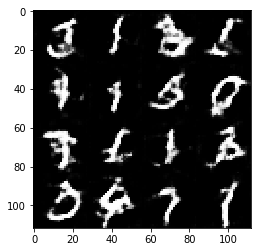

Epoch 1/2... Discriminator Loss: 0.1371... Generator Loss: 2.6456
Epoch 1/2... Discriminator Loss: 0.2966... Generator Loss: 2.0758
Epoch 1/2... Discriminator Loss: 1.0977... Generator Loss: 0.8683
Epoch 1/2... Discriminator Loss: 0.3569... Generator Loss: 1.9520
Epoch 1/2... Discriminator Loss: 1.0694... Generator Loss: 4.3105


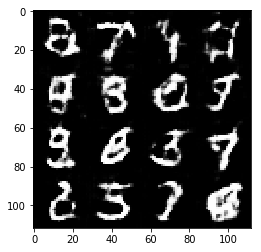

Epoch 1/2... Discriminator Loss: 0.1699... Generator Loss: 3.1553
Epoch 1/2... Discriminator Loss: 0.0953... Generator Loss: 3.2295
Epoch 1/2... Discriminator Loss: 0.1444... Generator Loss: 2.5673
Epoch 1/2... Discriminator Loss: 0.4670... Generator Loss: 1.3780
Epoch 1/2... Discriminator Loss: 0.3644... Generator Loss: 2.0044


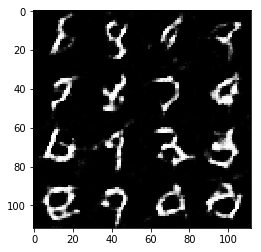

Epoch 1/2... Discriminator Loss: 0.9883... Generator Loss: 0.8911
Epoch 1/2... Discriminator Loss: 0.2257... Generator Loss: 1.9548
Epoch 1/2... Discriminator Loss: 0.2073... Generator Loss: 3.0085
Epoch 1/2... Discriminator Loss: 0.4622... Generator Loss: 1.2379
Epoch 1/2... Discriminator Loss: 0.8787... Generator Loss: 0.8882


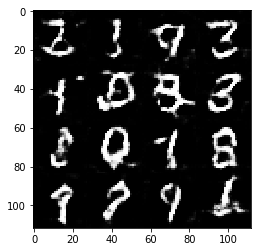

Epoch 1/2... Discriminator Loss: 0.1828... Generator Loss: 3.0756
Epoch 1/2... Discriminator Loss: 0.4054... Generator Loss: 1.5227
Epoch 1/2... Discriminator Loss: 0.4219... Generator Loss: 1.9264
Epoch 1/2... Discriminator Loss: 0.5416... Generator Loss: 1.1813
Epoch 1/2... Discriminator Loss: 0.3014... Generator Loss: 2.2329


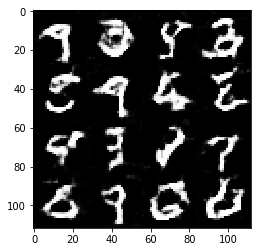

Epoch 1/2... Discriminator Loss: 0.2900... Generator Loss: 2.7107
Epoch 1/2... Discriminator Loss: 0.3373... Generator Loss: 1.8638
Epoch 1/2... Discriminator Loss: 0.3976... Generator Loss: 1.7628
Epoch 1/2... Discriminator Loss: 0.7482... Generator Loss: 0.8536
Epoch 1/2... Discriminator Loss: 0.1518... Generator Loss: 2.4548


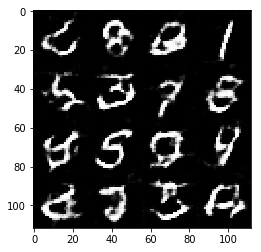

Epoch 1/2... Discriminator Loss: 0.1410... Generator Loss: 3.2208
Epoch 1/2... Discriminator Loss: 0.1617... Generator Loss: 3.0591
Epoch 1/2... Discriminator Loss: 0.9711... Generator Loss: 0.6821
Epoch 1/2... Discriminator Loss: 0.4442... Generator Loss: 1.6201
Epoch 1/2... Discriminator Loss: 2.0870... Generator Loss: 0.2339


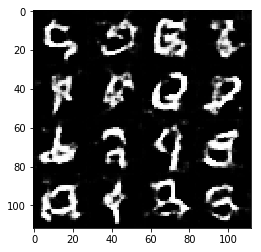

Epoch 1/2... Discriminator Loss: 0.5610... Generator Loss: 1.1944
Epoch 1/2... Discriminator Loss: 0.2813... Generator Loss: 1.8864
Epoch 1/2... Discriminator Loss: 0.3227... Generator Loss: 2.1136
Epoch 1/2... Discriminator Loss: 0.7638... Generator Loss: 0.8989
Epoch 1/2... Discriminator Loss: 0.3604... Generator Loss: 1.8152


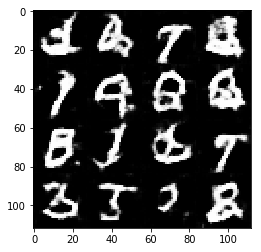

Epoch 1/2... Discriminator Loss: 0.2749... Generator Loss: 2.3197
Epoch 1/2... Discriminator Loss: 0.6587... Generator Loss: 1.1504
Epoch 1/2... Discriminator Loss: 0.2633... Generator Loss: 2.9434
Epoch 1/2... Discriminator Loss: 0.3037... Generator Loss: 1.7552
Epoch 1/2... Discriminator Loss: 0.2586... Generator Loss: 2.0592


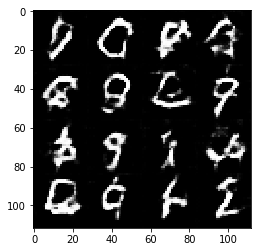

Epoch 1/2... Discriminator Loss: 0.6942... Generator Loss: 2.8640
Epoch 1/2... Discriminator Loss: 0.4259... Generator Loss: 1.5709
Epoch 1/2... Discriminator Loss: 0.4466... Generator Loss: 1.4657
Epoch 1/2... Discriminator Loss: 0.2524... Generator Loss: 2.2298
Epoch 1/2... Discriminator Loss: 0.3290... Generator Loss: 2.0065


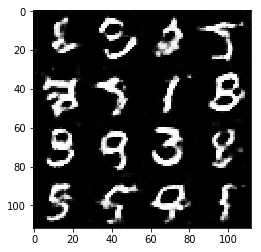

Epoch 1/2... Discriminator Loss: 0.3573... Generator Loss: 1.6395
Epoch 1/2... Discriminator Loss: 0.1524... Generator Loss: 3.3811
Epoch 1/2... Discriminator Loss: 0.2207... Generator Loss: 2.3064
Epoch 1/2... Discriminator Loss: 0.2513... Generator Loss: 2.3078
Epoch 1/2... Discriminator Loss: 0.3929... Generator Loss: 1.5178


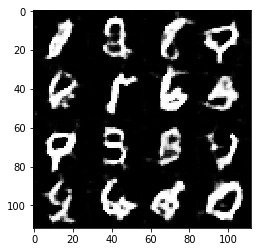

Epoch 1/2... Discriminator Loss: 0.9612... Generator Loss: 0.7073
Epoch 1/2... Discriminator Loss: 0.2140... Generator Loss: 1.9395
Epoch 1/2... Discriminator Loss: 0.8770... Generator Loss: 0.7227
Epoch 1/2... Discriminator Loss: 0.3076... Generator Loss: 1.7537
Epoch 1/2... Discriminator Loss: 0.1746... Generator Loss: 2.4046


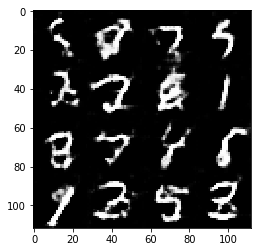

Epoch 1/2... Discriminator Loss: 0.2210... Generator Loss: 2.2099
Epoch 1/2... Discriminator Loss: 0.2808... Generator Loss: 2.5101
Epoch 1/2... Discriminator Loss: 0.4570... Generator Loss: 1.9454
Epoch 1/2... Discriminator Loss: 0.1427... Generator Loss: 3.0531
Epoch 1/2... Discriminator Loss: 0.2697... Generator Loss: 1.7806


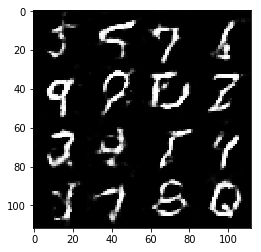

Epoch 1/2... Discriminator Loss: 1.0637... Generator Loss: 0.6751
Epoch 1/2... Discriminator Loss: 0.1426... Generator Loss: 2.6962
Epoch 1/2... Discriminator Loss: 0.4997... Generator Loss: 1.1460
Epoch 1/2... Discriminator Loss: 0.2603... Generator Loss: 2.1755
Epoch 1/2... Discriminator Loss: 0.3234... Generator Loss: 1.6663


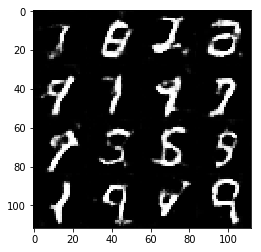

Epoch 1/2... Discriminator Loss: 0.7021... Generator Loss: 0.9632
Epoch 1/2... Discriminator Loss: 0.3442... Generator Loss: 1.9025
Epoch 1/2... Discriminator Loss: 0.7902... Generator Loss: 1.0392
Epoch 1/2... Discriminator Loss: 0.7700... Generator Loss: 0.9277
Epoch 1/2... Discriminator Loss: 0.2512... Generator Loss: 2.0145


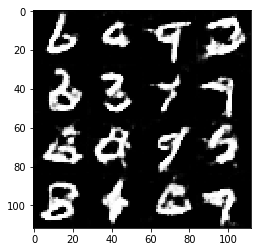

Epoch 1/2... Discriminator Loss: 0.5598... Generator Loss: 1.4646
Epoch 1/2... Discriminator Loss: 0.3563... Generator Loss: 1.9253
Epoch 1/2... Discriminator Loss: 2.6894... Generator Loss: 7.1722
Epoch 1/2... Discriminator Loss: 0.5592... Generator Loss: 4.7901
Epoch 1/2... Discriminator Loss: 0.7174... Generator Loss: 1.1691


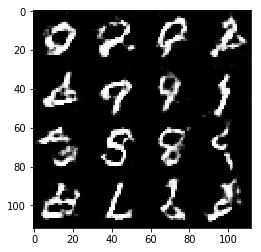

Epoch 1/2... Discriminator Loss: 0.2210... Generator Loss: 2.3430
Epoch 1/2... Discriminator Loss: 0.3668... Generator Loss: 1.6618
Epoch 1/2... Discriminator Loss: 0.2004... Generator Loss: 2.5504
Epoch 1/2... Discriminator Loss: 0.5699... Generator Loss: 1.1121
Epoch 1/2... Discriminator Loss: 0.3794... Generator Loss: 1.5564


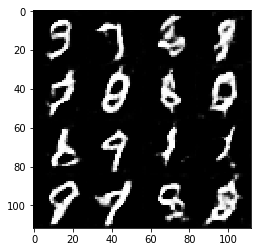

Epoch 1/2... Discriminator Loss: 0.5231... Generator Loss: 1.5252
Epoch 1/2... Discriminator Loss: 0.2220... Generator Loss: 2.1664
Epoch 1/2... Discriminator Loss: 0.1613... Generator Loss: 2.6232
Epoch 1/2... Discriminator Loss: 0.3000... Generator Loss: 2.3076
Epoch 1/2... Discriminator Loss: 0.1103... Generator Loss: 3.5993


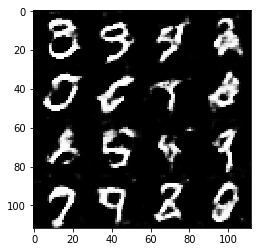

Epoch 1/2... Discriminator Loss: 0.1769... Generator Loss: 2.6880
Epoch 1/2... Discriminator Loss: 0.2942... Generator Loss: 1.7866
Epoch 1/2... Discriminator Loss: 0.2331... Generator Loss: 2.1847
Epoch 1/2... Discriminator Loss: 0.2697... Generator Loss: 2.3411
Epoch 1/2... Discriminator Loss: 0.2238... Generator Loss: 2.2655


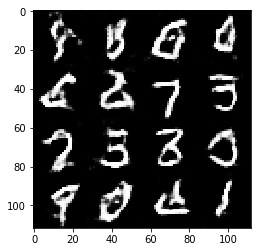

Epoch 1/2... Discriminator Loss: 0.4025... Generator Loss: 1.6613
Epoch 1/2... Discriminator Loss: 0.1432... Generator Loss: 2.9659
Epoch 1/2... Discriminator Loss: 0.3199... Generator Loss: 2.0677
Epoch 1/2... Discriminator Loss: 0.9976... Generator Loss: 0.6544
Epoch 1/2... Discriminator Loss: 0.3836... Generator Loss: 1.7637


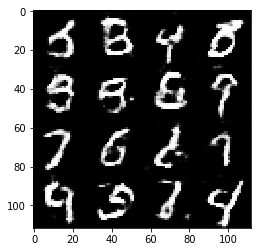

Epoch 1/2... Discriminator Loss: 0.3561... Generator Loss: 1.7025
Epoch 1/2... Discriminator Loss: 0.3385... Generator Loss: 1.7755
Epoch 1/2... Discriminator Loss: 0.5539... Generator Loss: 1.2231
Epoch 1/2... Discriminator Loss: 0.3754... Generator Loss: 1.6549
Epoch 1/2... Discriminator Loss: 0.5734... Generator Loss: 1.2244


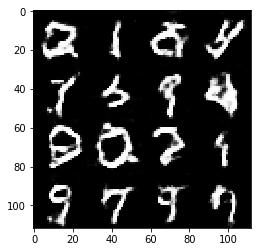

Epoch 1/2... Discriminator Loss: 0.1936... Generator Loss: 2.3865
Epoch 1/2... Discriminator Loss: 0.4116... Generator Loss: 1.6431
Epoch 1/2... Discriminator Loss: 0.3098... Generator Loss: 1.7748
Epoch 1/2... Discriminator Loss: 0.2275... Generator Loss: 2.3631
Epoch 1/2... Discriminator Loss: 2.2187... Generator Loss: 5.8228


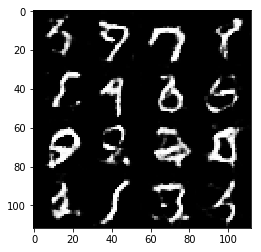

Epoch 1/2... Discriminator Loss: 0.3989... Generator Loss: 1.6555
Epoch 1/2... Discriminator Loss: 0.1952... Generator Loss: 2.4215
Epoch 1/2... Discriminator Loss: 0.4320... Generator Loss: 1.5369
Epoch 1/2... Discriminator Loss: 1.9132... Generator Loss: 0.2806
Epoch 1/2... Discriminator Loss: 0.1328... Generator Loss: 3.6129


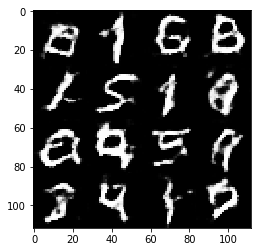

Epoch 1/2... Discriminator Loss: 0.2437... Generator Loss: 2.3619
Epoch 1/2... Discriminator Loss: 0.3561... Generator Loss: 1.4704
Epoch 1/2... Discriminator Loss: 0.2974... Generator Loss: 1.9152
Epoch 1/2... Discriminator Loss: 0.3806... Generator Loss: 1.6712
Epoch 1/2... Discriminator Loss: 0.3739... Generator Loss: 2.2336


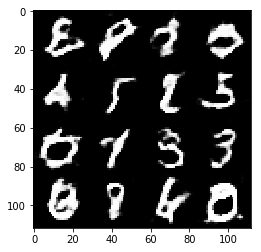

Epoch 1/2... Discriminator Loss: 0.3235... Generator Loss: 1.5918
Epoch 1/2... Discriminator Loss: 0.4666... Generator Loss: 1.3363
Epoch 1/2... Discriminator Loss: 0.4644... Generator Loss: 1.6139
Epoch 1/2... Discriminator Loss: 0.4576... Generator Loss: 1.2913
Epoch 1/2... Discriminator Loss: 0.4015... Generator Loss: 1.5751


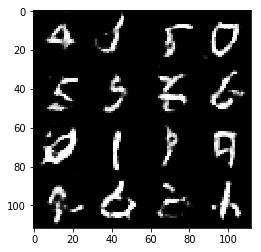

Epoch 1/2... Discriminator Loss: 0.1474... Generator Loss: 2.4333
Epoch 1/2... Discriminator Loss: 0.2624... Generator Loss: 1.8407
Epoch 1/2... Discriminator Loss: 0.3224... Generator Loss: 1.7206
Epoch 1/2... Discriminator Loss: 0.1103... Generator Loss: 2.9379
Epoch 1/2... Discriminator Loss: 0.4085... Generator Loss: 1.4968


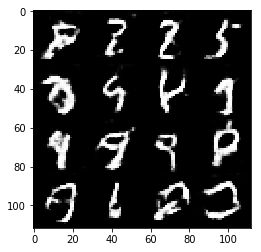

Epoch 1/2... Discriminator Loss: 0.3893... Generator Loss: 1.5599
Epoch 1/2... Discriminator Loss: 0.2295... Generator Loss: 1.9840
Epoch 1/2... Discriminator Loss: 0.3665... Generator Loss: 1.8603
Epoch 1/2... Discriminator Loss: 0.3977... Generator Loss: 1.4915
Epoch 1/2... Discriminator Loss: 0.1321... Generator Loss: 3.1230


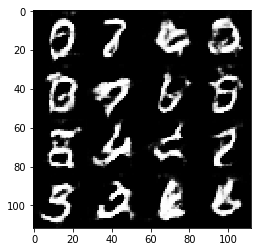

Epoch 1/2... Discriminator Loss: 0.1835... Generator Loss: 2.7116
Epoch 1/2... Discriminator Loss: 0.1418... Generator Loss: 2.8157
Epoch 1/2... Discriminator Loss: 0.2325... Generator Loss: 1.9514
Epoch 1/2... Discriminator Loss: 0.1987... Generator Loss: 2.1634
Epoch 1/2... Discriminator Loss: 0.5014... Generator Loss: 1.3578


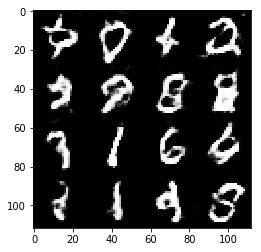

Epoch 1/2... Discriminator Loss: 0.3459... Generator Loss: 1.5143
Epoch 1/2... Discriminator Loss: 0.1488... Generator Loss: 2.3925
Epoch 1/2... Discriminator Loss: 0.3025... Generator Loss: 1.7636
Epoch 1/2... Discriminator Loss: 0.3842... Generator Loss: 1.3847
Epoch 1/2... Discriminator Loss: 0.2827... Generator Loss: 1.9099


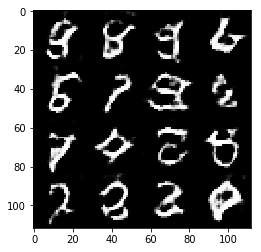

Epoch 1/2... Discriminator Loss: 0.1401... Generator Loss: 2.6512
Epoch 1/2... Discriminator Loss: 0.1242... Generator Loss: 2.5393
Epoch 1/2... Discriminator Loss: 0.2250... Generator Loss: 2.7382
Epoch 1/2... Discriminator Loss: 0.2549... Generator Loss: 3.4648
Epoch 1/2... Discriminator Loss: 0.2967... Generator Loss: 2.0745


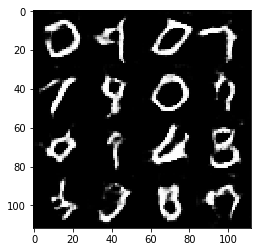

Epoch 1/2... Discriminator Loss: 0.6150... Generator Loss: 0.9485
Epoch 1/2... Discriminator Loss: 0.6458... Generator Loss: 1.1404
Epoch 1/2... Discriminator Loss: 0.2016... Generator Loss: 2.3273
Epoch 1/2... Discriminator Loss: 0.2158... Generator Loss: 2.3050
Epoch 1/2... Discriminator Loss: 0.2964... Generator Loss: 1.9621


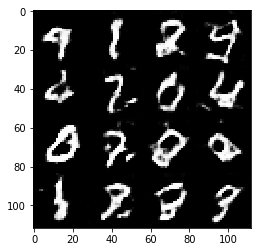

Epoch 1/2... Discriminator Loss: 0.1495... Generator Loss: 2.4233
Epoch 1/2... Discriminator Loss: 0.3998... Generator Loss: 1.4620
Epoch 1/2... Discriminator Loss: 0.2739... Generator Loss: 1.7153
Epoch 1/2... Discriminator Loss: 0.6176... Generator Loss: 1.2970
Epoch 1/2... Discriminator Loss: 0.7265... Generator Loss: 0.9837


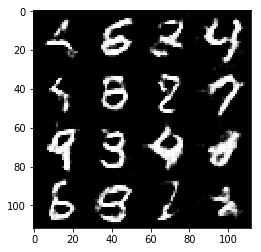

Epoch 1/2... Discriminator Loss: 0.4760... Generator Loss: 1.2807
Epoch 1/2... Discriminator Loss: 0.4988... Generator Loss: 1.3561
Epoch 1/2... Discriminator Loss: 0.6187... Generator Loss: 2.7152
Epoch 1/2... Discriminator Loss: 1.1572... Generator Loss: 0.6835
Epoch 1/2... Discriminator Loss: 0.3045... Generator Loss: 2.1750


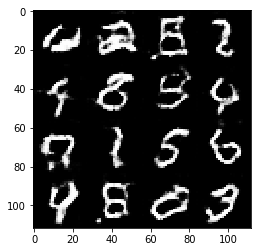

Epoch 1/2... Discriminator Loss: 0.7044... Generator Loss: 0.9120
Epoch 1/2... Discriminator Loss: 0.3557... Generator Loss: 1.9196
Epoch 1/2... Discriminator Loss: 0.2142... Generator Loss: 2.2755
Epoch 1/2... Discriminator Loss: 0.1653... Generator Loss: 2.3128
Epoch 1/2... Discriminator Loss: 0.4428... Generator Loss: 1.7635


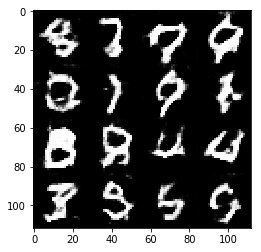

Epoch 1/2... Discriminator Loss: 0.2369... Generator Loss: 1.7492
Epoch 1/2... Discriminator Loss: 0.4087... Generator Loss: 1.3593
Epoch 1/2... Discriminator Loss: 0.2034... Generator Loss: 2.8872
Epoch 1/2... Discriminator Loss: 0.2276... Generator Loss: 2.4728
Epoch 1/2... Discriminator Loss: 0.1953... Generator Loss: 2.0970


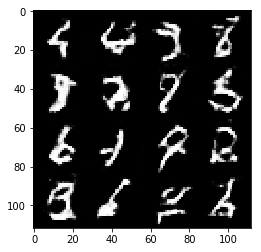

Epoch 1/2... Discriminator Loss: 0.1824... Generator Loss: 2.1861
Epoch 1/2... Discriminator Loss: 0.5850... Generator Loss: 1.1784
Epoch 1/2... Discriminator Loss: 0.3546... Generator Loss: 1.5459
Epoch 1/2... Discriminator Loss: 0.1072... Generator Loss: 2.6479
Epoch 1/2... Discriminator Loss: 0.5065... Generator Loss: 3.7590


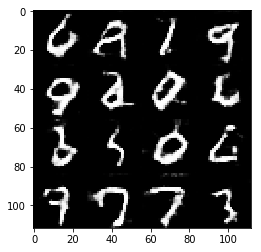

Epoch 1/2... Discriminator Loss: 0.2895... Generator Loss: 1.6918
Epoch 1/2... Discriminator Loss: 0.0953... Generator Loss: 2.8087
Epoch 1/2... Discriminator Loss: 0.3069... Generator Loss: 1.9818
Epoch 1/2... Discriminator Loss: 2.1938... Generator Loss: 8.4470
Epoch 1/2... Discriminator Loss: 0.6135... Generator Loss: 1.1886


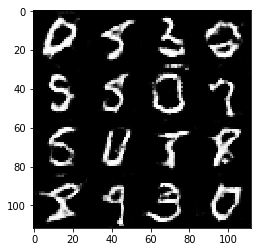

Epoch 1/2... Discriminator Loss: 0.3474... Generator Loss: 1.8497
Epoch 1/2... Discriminator Loss: 0.3136... Generator Loss: 1.7103
Epoch 1/2... Discriminator Loss: 0.2899... Generator Loss: 2.0685
Epoch 1/2... Discriminator Loss: 0.2434... Generator Loss: 2.4693
Epoch 1/2... Discriminator Loss: 0.1398... Generator Loss: 2.7524


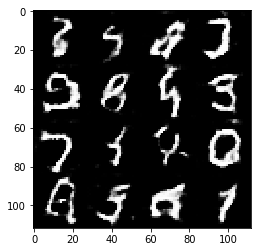

Epoch 1/2... Discriminator Loss: 0.0540... Generator Loss: 3.4482
Epoch 1/2... Discriminator Loss: 0.2850... Generator Loss: 1.9933
Epoch 1/2... Discriminator Loss: 0.4074... Generator Loss: 2.2566
Epoch 1/2... Discriminator Loss: 0.1107... Generator Loss: 2.7154
Epoch 1/2... Discriminator Loss: 0.2698... Generator Loss: 1.7636


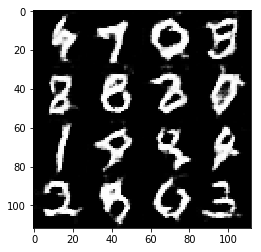

Epoch 1/2... Discriminator Loss: 1.2248... Generator Loss: 0.6847
Epoch 1/2... Discriminator Loss: 0.1899... Generator Loss: 2.3661
Epoch 1/2... Discriminator Loss: 0.2465... Generator Loss: 2.3329
Epoch 1/2... Discriminator Loss: 0.1352... Generator Loss: 3.0076
Epoch 1/2... Discriminator Loss: 0.3552... Generator Loss: 1.6744


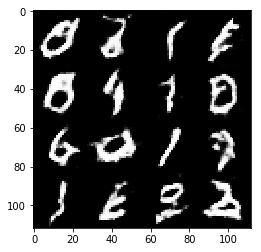

Epoch 1/2... Discriminator Loss: 0.1773... Generator Loss: 2.5868
Epoch 1/2... Discriminator Loss: 0.3784... Generator Loss: 1.5662
Epoch 1/2... Discriminator Loss: 1.0144... Generator Loss: 0.6956
Epoch 1/2... Discriminator Loss: 0.2559... Generator Loss: 2.5098
Epoch 1/2... Discriminator Loss: 0.4891... Generator Loss: 1.2192


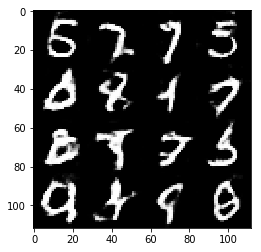

Epoch 1/2... Discriminator Loss: 0.2654... Generator Loss: 1.7268
Epoch 1/2... Discriminator Loss: 0.1779... Generator Loss: 2.8162
Epoch 1/2... Discriminator Loss: 0.1299... Generator Loss: 3.4252
Epoch 1/2... Discriminator Loss: 0.1280... Generator Loss: 2.9668
Epoch 1/2... Discriminator Loss: 0.1622... Generator Loss: 2.4492


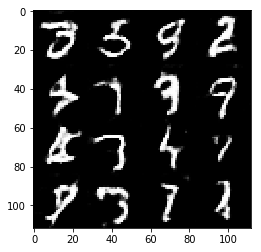

Epoch 1/2... Discriminator Loss: 0.3720... Generator Loss: 1.6097
Epoch 1/2... Discriminator Loss: 0.3741... Generator Loss: 1.6329
Epoch 1/2... Discriminator Loss: 1.4787... Generator Loss: 0.3854
Epoch 1/2... Discriminator Loss: 0.2500... Generator Loss: 3.2557
Epoch 1/2... Discriminator Loss: 0.3383... Generator Loss: 2.3571


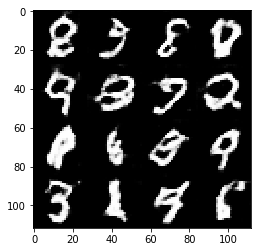

Epoch 1/2... Discriminator Loss: 0.3081... Generator Loss: 1.8634
Epoch 1/2... Discriminator Loss: 0.1903... Generator Loss: 2.6005
Epoch 1/2... Discriminator Loss: 0.2752... Generator Loss: 2.8383
Epoch 1/2... Discriminator Loss: 0.2834... Generator Loss: 1.9608
Epoch 1/2... Discriminator Loss: 0.5436... Generator Loss: 1.1939


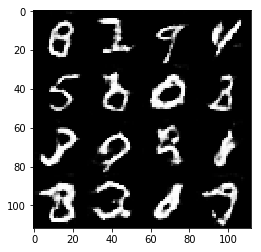

Epoch 1/2... Discriminator Loss: 0.6758... Generator Loss: 1.0653
Epoch 1/2... Discriminator Loss: 0.2205... Generator Loss: 1.9770
Epoch 1/2... Discriminator Loss: 0.1843... Generator Loss: 2.4617
Epoch 1/2... Discriminator Loss: 0.1458... Generator Loss: 3.0678
Epoch 1/2... Discriminator Loss: 0.3881... Generator Loss: 1.9923


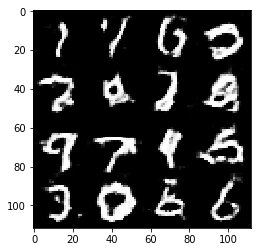

Epoch 2/2... Discriminator Loss: 0.2330... Generator Loss: 1.9693
Epoch 2/2... Discriminator Loss: 0.0773... Generator Loss: 3.6842
Epoch 2/2... Discriminator Loss: 0.7999... Generator Loss: 0.9179
Epoch 2/2... Discriminator Loss: 0.7138... Generator Loss: 3.5343
Epoch 2/2... Discriminator Loss: 0.2771... Generator Loss: 2.4726


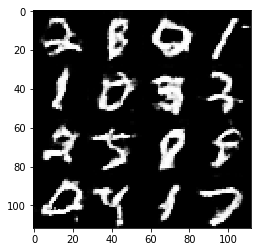

Epoch 2/2... Discriminator Loss: 0.9952... Generator Loss: 0.6272
Epoch 2/2... Discriminator Loss: 0.1688... Generator Loss: 2.7888
Epoch 2/2... Discriminator Loss: 0.3800... Generator Loss: 2.0015
Epoch 2/2... Discriminator Loss: 0.2810... Generator Loss: 2.1252
Epoch 2/2... Discriminator Loss: 0.2422... Generator Loss: 2.0404


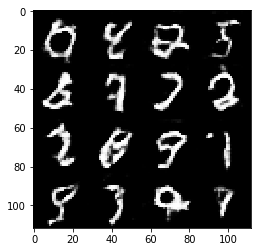

Epoch 2/2... Discriminator Loss: 0.6169... Generator Loss: 0.9755
Epoch 2/2... Discriminator Loss: 0.4599... Generator Loss: 1.5235
Epoch 2/2... Discriminator Loss: 0.7277... Generator Loss: 0.8146
Epoch 2/2... Discriminator Loss: 0.4053... Generator Loss: 1.6465
Epoch 2/2... Discriminator Loss: 0.1557... Generator Loss: 2.3953


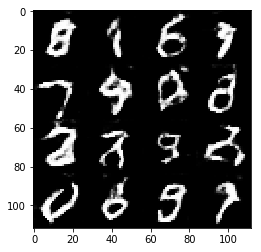

Epoch 2/2... Discriminator Loss: 0.2556... Generator Loss: 1.9641
Epoch 2/2... Discriminator Loss: 0.1537... Generator Loss: 2.6182
Epoch 2/2... Discriminator Loss: 0.2092... Generator Loss: 1.9597
Epoch 2/2... Discriminator Loss: 0.3603... Generator Loss: 1.9098
Epoch 2/2... Discriminator Loss: 0.5017... Generator Loss: 1.3357


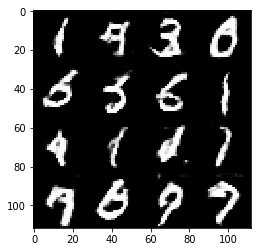

Epoch 2/2... Discriminator Loss: 0.3123... Generator Loss: 2.9659
Epoch 2/2... Discriminator Loss: 0.0358... Generator Loss: 4.6870
Epoch 2/2... Discriminator Loss: 0.2754... Generator Loss: 1.9916
Epoch 2/2... Discriminator Loss: 0.1304... Generator Loss: 2.8883
Epoch 2/2... Discriminator Loss: 0.2024... Generator Loss: 2.3612


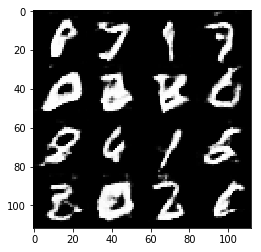

Epoch 2/2... Discriminator Loss: 0.1272... Generator Loss: 2.8114
Epoch 2/2... Discriminator Loss: 0.3222... Generator Loss: 1.9795
Epoch 2/2... Discriminator Loss: 0.2718... Generator Loss: 2.2638
Epoch 2/2... Discriminator Loss: 0.1573... Generator Loss: 2.9286
Epoch 2/2... Discriminator Loss: 0.5513... Generator Loss: 1.2105


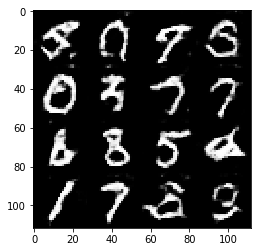

Epoch 2/2... Discriminator Loss: 0.4839... Generator Loss: 1.4105
Epoch 2/2... Discriminator Loss: 0.2451... Generator Loss: 1.9946
Epoch 2/2... Discriminator Loss: 0.2112... Generator Loss: 2.1163
Epoch 2/2... Discriminator Loss: 0.9955... Generator Loss: 0.6000
Epoch 2/2... Discriminator Loss: 0.0710... Generator Loss: 3.4572


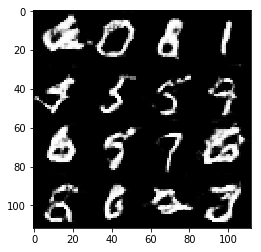

Epoch 2/2... Discriminator Loss: 0.2985... Generator Loss: 1.7395
Epoch 2/2... Discriminator Loss: 0.1527... Generator Loss: 2.9012
Epoch 2/2... Discriminator Loss: 0.0735... Generator Loss: 3.6151
Epoch 2/2... Discriminator Loss: 0.4837... Generator Loss: 1.6994
Epoch 2/2... Discriminator Loss: 0.3036... Generator Loss: 1.7959


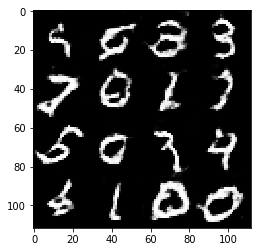

Epoch 2/2... Discriminator Loss: 0.6492... Generator Loss: 1.2751
Epoch 2/2... Discriminator Loss: 0.8653... Generator Loss: 0.7931
Epoch 2/2... Discriminator Loss: 0.1578... Generator Loss: 2.6770
Epoch 2/2... Discriminator Loss: 0.0780... Generator Loss: 3.4543
Epoch 2/2... Discriminator Loss: 0.1738... Generator Loss: 2.8408


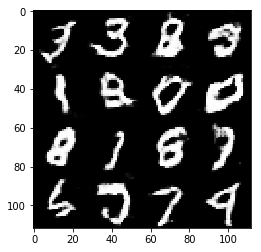

Epoch 2/2... Discriminator Loss: 0.2134... Generator Loss: 2.1573
Epoch 2/2... Discriminator Loss: 1.1471... Generator Loss: 0.5693
Epoch 2/2... Discriminator Loss: 0.5886... Generator Loss: 1.2029
Epoch 2/2... Discriminator Loss: 0.9170... Generator Loss: 0.8247
Epoch 2/2... Discriminator Loss: 0.2104... Generator Loss: 2.4093


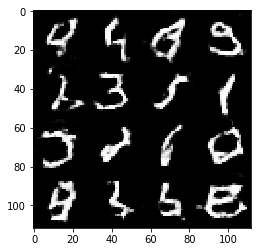

Epoch 2/2... Discriminator Loss: 0.2278... Generator Loss: 2.1952
Epoch 2/2... Discriminator Loss: 0.2909... Generator Loss: 1.7433
Epoch 2/2... Discriminator Loss: 0.0510... Generator Loss: 3.9242
Epoch 2/2... Discriminator Loss: 0.9761... Generator Loss: 0.6741
Epoch 2/2... Discriminator Loss: 0.2633... Generator Loss: 2.0888


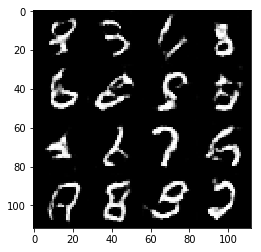

Epoch 2/2... Discriminator Loss: 0.2322... Generator Loss: 2.7263
Epoch 2/2... Discriminator Loss: 0.2573... Generator Loss: 1.9696
Epoch 2/2... Discriminator Loss: 0.3202... Generator Loss: 1.5410
Epoch 2/2... Discriminator Loss: 0.7685... Generator Loss: 1.3134
Epoch 2/2... Discriminator Loss: 0.8307... Generator Loss: 0.7591


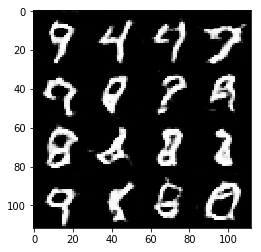

Epoch 2/2... Discriminator Loss: 0.2212... Generator Loss: 2.1037
Epoch 2/2... Discriminator Loss: 0.2039... Generator Loss: 2.2269
Epoch 2/2... Discriminator Loss: 0.2930... Generator Loss: 1.8200
Epoch 2/2... Discriminator Loss: 1.1086... Generator Loss: 0.8788
Epoch 2/2... Discriminator Loss: 0.2288... Generator Loss: 2.0758


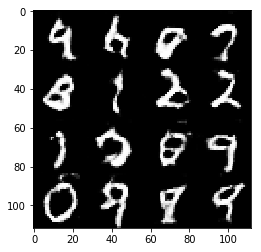

Epoch 2/2... Discriminator Loss: 0.1768... Generator Loss: 2.4390
Epoch 2/2... Discriminator Loss: 0.1229... Generator Loss: 2.8218
Epoch 2/2... Discriminator Loss: 0.9269... Generator Loss: 0.7062
Epoch 2/2... Discriminator Loss: 0.1015... Generator Loss: 2.6974
Epoch 2/2... Discriminator Loss: 0.2979... Generator Loss: 1.9939


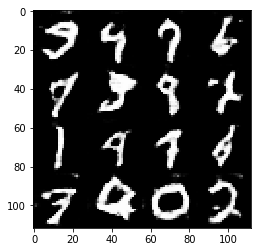

Epoch 2/2... Discriminator Loss: 0.2153... Generator Loss: 1.9944
Epoch 2/2... Discriminator Loss: 0.8820... Generator Loss: 0.7801
Epoch 2/2... Discriminator Loss: 0.1044... Generator Loss: 3.8969
Epoch 2/2... Discriminator Loss: 0.4447... Generator Loss: 1.2833
Epoch 2/2... Discriminator Loss: 0.1522... Generator Loss: 2.6541


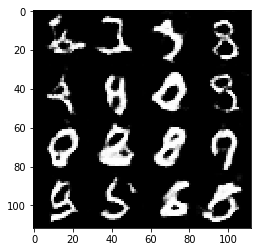

Epoch 2/2... Discriminator Loss: 0.7159... Generator Loss: 0.9780
Epoch 2/2... Discriminator Loss: 0.1087... Generator Loss: 2.8544
Epoch 2/2... Discriminator Loss: 0.1225... Generator Loss: 3.0474
Epoch 2/2... Discriminator Loss: 0.2619... Generator Loss: 2.0386
Epoch 2/2... Discriminator Loss: 1.0821... Generator Loss: 5.3963


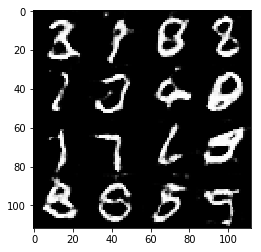

Epoch 2/2... Discriminator Loss: 0.2167... Generator Loss: 4.4963
Epoch 2/2... Discriminator Loss: 0.2253... Generator Loss: 1.9827
Epoch 2/2... Discriminator Loss: 0.0927... Generator Loss: 3.7550
Epoch 2/2... Discriminator Loss: 0.0963... Generator Loss: 3.4279
Epoch 2/2... Discriminator Loss: 0.8720... Generator Loss: 1.1703


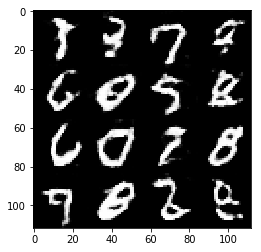

Epoch 2/2... Discriminator Loss: 0.0686... Generator Loss: 3.4429
Epoch 2/2... Discriminator Loss: 0.2406... Generator Loss: 2.3084
Epoch 2/2... Discriminator Loss: 0.3435... Generator Loss: 2.1580
Epoch 2/2... Discriminator Loss: 0.4572... Generator Loss: 2.7838
Epoch 2/2... Discriminator Loss: 0.2022... Generator Loss: 2.3934


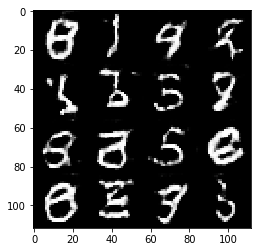

Epoch 2/2... Discriminator Loss: 0.2504... Generator Loss: 2.0605
Epoch 2/2... Discriminator Loss: 0.5130... Generator Loss: 1.3016
Epoch 2/2... Discriminator Loss: 0.2787... Generator Loss: 2.9960
Epoch 2/2... Discriminator Loss: 0.4508... Generator Loss: 1.1743
Epoch 2/2... Discriminator Loss: 0.1803... Generator Loss: 2.2679


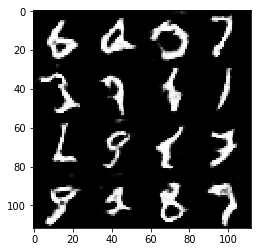

Epoch 2/2... Discriminator Loss: 0.2318... Generator Loss: 2.0567
Epoch 2/2... Discriminator Loss: 0.4619... Generator Loss: 1.2144
Epoch 2/2... Discriminator Loss: 0.9691... Generator Loss: 0.7696
Epoch 2/2... Discriminator Loss: 0.1760... Generator Loss: 2.1445
Epoch 2/2... Discriminator Loss: 0.1194... Generator Loss: 2.5887


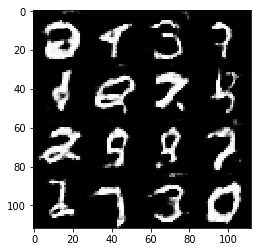

Epoch 2/2... Discriminator Loss: 0.3254... Generator Loss: 1.7735
Epoch 2/2... Discriminator Loss: 0.4926... Generator Loss: 1.4241
Epoch 2/2... Discriminator Loss: 2.2159... Generator Loss: 0.3486
Epoch 2/2... Discriminator Loss: 0.1946... Generator Loss: 2.6468
Epoch 2/2... Discriminator Loss: 0.4093... Generator Loss: 1.5267


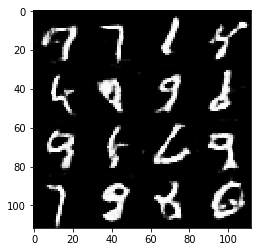

Epoch 2/2... Discriminator Loss: 0.4380... Generator Loss: 1.4636
Epoch 2/2... Discriminator Loss: 0.2486... Generator Loss: 1.9973
Epoch 2/2... Discriminator Loss: 0.3822... Generator Loss: 1.4737
Epoch 2/2... Discriminator Loss: 0.1995... Generator Loss: 2.3264
Epoch 2/2... Discriminator Loss: 0.2878... Generator Loss: 1.8081


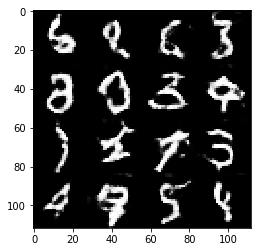

Epoch 2/2... Discriminator Loss: 0.3588... Generator Loss: 1.5320
Epoch 2/2... Discriminator Loss: 0.2517... Generator Loss: 2.5505
Epoch 2/2... Discriminator Loss: 0.4796... Generator Loss: 1.3883
Epoch 2/2... Discriminator Loss: 0.0703... Generator Loss: 3.1800
Epoch 2/2... Discriminator Loss: 0.6034... Generator Loss: 1.3445


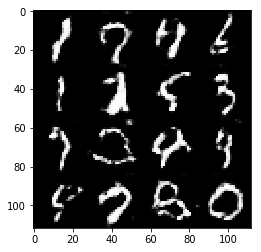

Epoch 2/2... Discriminator Loss: 0.2298... Generator Loss: 2.1840
Epoch 2/2... Discriminator Loss: 0.7512... Generator Loss: 1.2170
Epoch 2/2... Discriminator Loss: 0.1965... Generator Loss: 2.2791
Epoch 2/2... Discriminator Loss: 0.5459... Generator Loss: 1.0517
Epoch 2/2... Discriminator Loss: 0.1349... Generator Loss: 3.4867


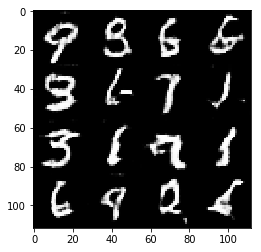

Epoch 2/2... Discriminator Loss: 0.3589... Generator Loss: 1.7764
Epoch 2/2... Discriminator Loss: 0.4305... Generator Loss: 1.8609
Epoch 2/2... Discriminator Loss: 0.2604... Generator Loss: 1.9021
Epoch 2/2... Discriminator Loss: 0.2601... Generator Loss: 1.9273
Epoch 2/2... Discriminator Loss: 1.4936... Generator Loss: 0.3870


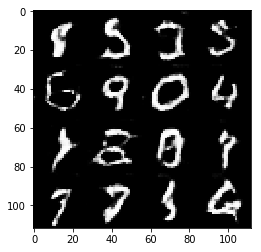

Epoch 2/2... Discriminator Loss: 0.2679... Generator Loss: 1.9522
Epoch 2/2... Discriminator Loss: 0.4875... Generator Loss: 1.3481
Epoch 2/2... Discriminator Loss: 0.1034... Generator Loss: 3.5872
Epoch 2/2... Discriminator Loss: 0.1006... Generator Loss: 3.5770
Epoch 2/2... Discriminator Loss: 0.0919... Generator Loss: 3.2308


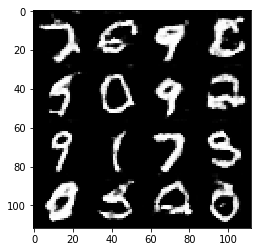

Epoch 2/2... Discriminator Loss: 0.5374... Generator Loss: 1.5167
Epoch 2/2... Discriminator Loss: 0.1382... Generator Loss: 3.2565
Epoch 2/2... Discriminator Loss: 0.2771... Generator Loss: 1.7315
Epoch 2/2... Discriminator Loss: 0.3166... Generator Loss: 1.9459
Epoch 2/2... Discriminator Loss: 0.8220... Generator Loss: 0.7873


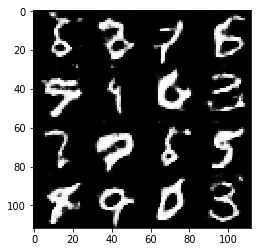

Epoch 2/2... Discriminator Loss: 0.2526... Generator Loss: 2.4467
Epoch 2/2... Discriminator Loss: 0.1975... Generator Loss: 2.7422
Epoch 2/2... Discriminator Loss: 0.2524... Generator Loss: 1.9918
Epoch 2/2... Discriminator Loss: 0.2492... Generator Loss: 1.8685
Epoch 2/2... Discriminator Loss: 0.0409... Generator Loss: 4.3984


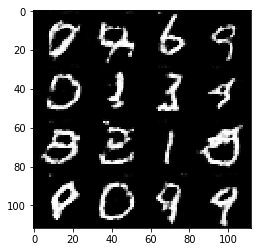

Epoch 2/2... Discriminator Loss: 0.2802... Generator Loss: 1.8264
Epoch 2/2... Discriminator Loss: 0.3280... Generator Loss: 2.3226
Epoch 2/2... Discriminator Loss: 0.5898... Generator Loss: 1.3004
Epoch 2/2... Discriminator Loss: 0.2188... Generator Loss: 2.3975
Epoch 2/2... Discriminator Loss: 0.2629... Generator Loss: 1.9438


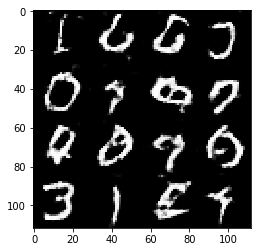

Epoch 2/2... Discriminator Loss: 0.2924... Generator Loss: 2.1076
Epoch 2/2... Discriminator Loss: 0.2318... Generator Loss: 2.5234
Epoch 2/2... Discriminator Loss: 0.1268... Generator Loss: 2.9549
Epoch 2/2... Discriminator Loss: 0.4775... Generator Loss: 1.7105
Epoch 2/2... Discriminator Loss: 0.2258... Generator Loss: 1.9512


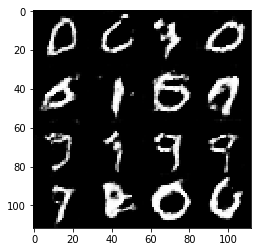

Epoch 2/2... Discriminator Loss: 0.3471... Generator Loss: 1.9525
Epoch 2/2... Discriminator Loss: 0.3219... Generator Loss: 1.8090
Epoch 2/2... Discriminator Loss: 1.6374... Generator Loss: 0.4232
Epoch 2/2... Discriminator Loss: 1.5025... Generator Loss: 0.3821
Epoch 2/2... Discriminator Loss: 0.1616... Generator Loss: 2.9329


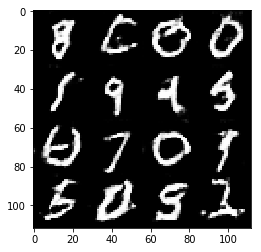

Epoch 2/2... Discriminator Loss: 0.2138... Generator Loss: 2.4194
Epoch 2/2... Discriminator Loss: 0.1423... Generator Loss: 2.6056
Epoch 2/2... Discriminator Loss: 0.3089... Generator Loss: 1.7645
Epoch 2/2... Discriminator Loss: 0.1053... Generator Loss: 2.9763
Epoch 2/2... Discriminator Loss: 0.5080... Generator Loss: 1.2309


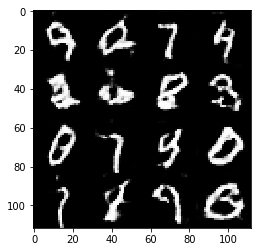

Epoch 2/2... Discriminator Loss: 0.2416... Generator Loss: 2.1633
Epoch 2/2... Discriminator Loss: 0.1416... Generator Loss: 2.5881
Epoch 2/2... Discriminator Loss: 0.1704... Generator Loss: 2.4954
Epoch 2/2... Discriminator Loss: 0.2957... Generator Loss: 1.6684
Epoch 2/2... Discriminator Loss: 0.6297... Generator Loss: 1.0523


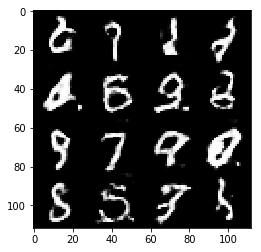

Epoch 2/2... Discriminator Loss: 0.5243... Generator Loss: 1.4507
Epoch 2/2... Discriminator Loss: 0.1650... Generator Loss: 2.5842
Epoch 2/2... Discriminator Loss: 0.0729... Generator Loss: 3.8846
Epoch 2/2... Discriminator Loss: 0.3761... Generator Loss: 1.5531
Epoch 2/2... Discriminator Loss: 0.2023... Generator Loss: 2.5270


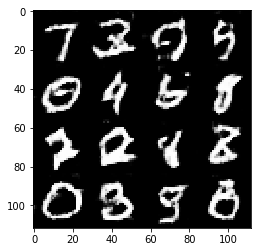

Epoch 2/2... Discriminator Loss: 1.1463... Generator Loss: 0.6593
Epoch 2/2... Discriminator Loss: 0.0815... Generator Loss: 3.5716
Epoch 2/2... Discriminator Loss: 0.3290... Generator Loss: 2.7603
Epoch 2/2... Discriminator Loss: 0.1848... Generator Loss: 2.2770
Epoch 2/2... Discriminator Loss: 0.2055... Generator Loss: 2.2711


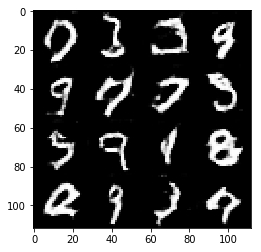

Epoch 2/2... Discriminator Loss: 0.1361... Generator Loss: 3.2703
Epoch 2/2... Discriminator Loss: 0.1469... Generator Loss: 2.3353
Epoch 2/2... Discriminator Loss: 0.1674... Generator Loss: 2.5400
Epoch 2/2... Discriminator Loss: 0.2596... Generator Loss: 2.3283
Epoch 2/2... Discriminator Loss: 0.1637... Generator Loss: 2.4857


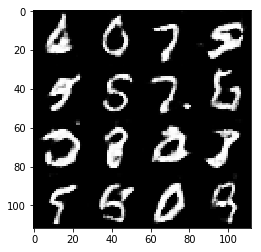

Epoch 2/2... Discriminator Loss: 0.2593... Generator Loss: 2.2702
Epoch 2/2... Discriminator Loss: 1.2701... Generator Loss: 0.6461
Epoch 2/2... Discriminator Loss: 0.1655... Generator Loss: 2.3656
Epoch 2/2... Discriminator Loss: 0.3067... Generator Loss: 2.0657
Epoch 2/2... Discriminator Loss: 1.0391... Generator Loss: 0.7805


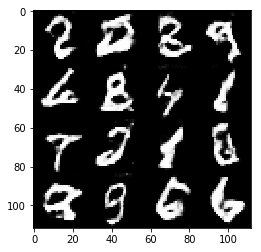

Epoch 2/2... Discriminator Loss: 0.9321... Generator Loss: 0.7592
Epoch 2/2... Discriminator Loss: 0.0869... Generator Loss: 2.8710
Epoch 2/2... Discriminator Loss: 0.3845... Generator Loss: 1.6285
Epoch 2/2... Discriminator Loss: 0.1298... Generator Loss: 3.1904
Epoch 2/2... Discriminator Loss: 0.0845... Generator Loss: 3.3303


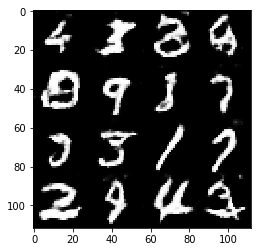

Epoch 2/2... Discriminator Loss: 0.2467... Generator Loss: 2.0356
Epoch 2/2... Discriminator Loss: 0.1624... Generator Loss: 2.3322
Epoch 2/2... Discriminator Loss: 0.3866... Generator Loss: 1.3889
Epoch 2/2... Discriminator Loss: 0.2372... Generator Loss: 2.1402
Epoch 2/2... Discriminator Loss: 0.2438... Generator Loss: 1.8337


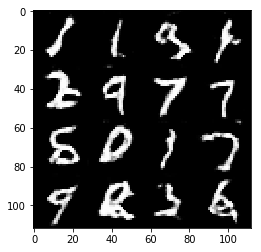

Epoch 2/2... Discriminator Loss: 0.1072... Generator Loss: 3.9524
Epoch 2/2... Discriminator Loss: 0.3913... Generator Loss: 2.3126
Epoch 2/2... Discriminator Loss: 1.2490... Generator Loss: 0.5327
Epoch 2/2... Discriminator Loss: 0.1909... Generator Loss: 3.2417
Epoch 2/2... Discriminator Loss: 1.2593... Generator Loss: 0.4741


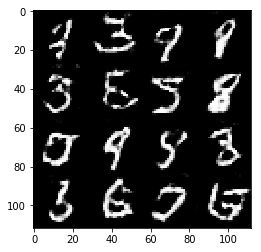

Epoch 2/2... Discriminator Loss: 0.1690... Generator Loss: 2.5257
Epoch 2/2... Discriminator Loss: 0.1022... Generator Loss: 3.3122
Epoch 2/2... Discriminator Loss: 0.0826... Generator Loss: 3.4118
Epoch 2/2... Discriminator Loss: 0.2567... Generator Loss: 2.1379
Epoch 2/2... Discriminator Loss: 0.3030... Generator Loss: 1.9045


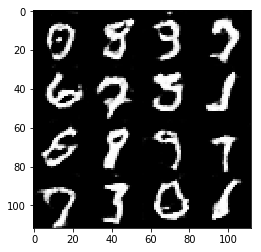

Epoch 2/2... Discriminator Loss: 0.2043... Generator Loss: 2.2604
Epoch 2/2... Discriminator Loss: 0.1033... Generator Loss: 3.2309
Epoch 2/2... Discriminator Loss: 0.5862... Generator Loss: 1.1463
Epoch 2/2... Discriminator Loss: 0.2954... Generator Loss: 1.9680
Epoch 2/2... Discriminator Loss: 0.0794... Generator Loss: 2.8572


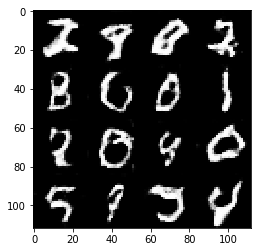

Epoch 2/2... Discriminator Loss: 0.0713... Generator Loss: 3.6135
Epoch 2/2... Discriminator Loss: 0.5477... Generator Loss: 1.4020
Epoch 2/2... Discriminator Loss: 0.3601... Generator Loss: 1.8888
Epoch 2/2... Discriminator Loss: 0.2001... Generator Loss: 2.2260
Epoch 2/2... Discriminator Loss: 0.1008... Generator Loss: 3.3268


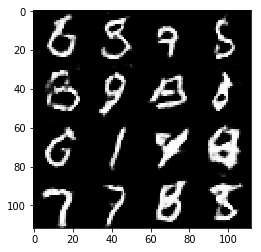

Epoch 2/2... Discriminator Loss: 0.4173... Generator Loss: 1.3899
Epoch 2/2... Discriminator Loss: 0.2319... Generator Loss: 2.5403
Epoch 2/2... Discriminator Loss: 0.0408... Generator Loss: 3.6592
Epoch 2/2... Discriminator Loss: 0.1101... Generator Loss: 3.0224
Epoch 2/2... Discriminator Loss: 0.2187... Generator Loss: 2.2165


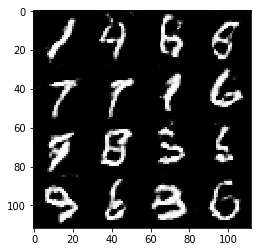

Epoch 2/2... Discriminator Loss: 0.1445... Generator Loss: 2.5952
Epoch 2/2... Discriminator Loss: 0.4247... Generator Loss: 1.8527
Epoch 2/2... Discriminator Loss: 0.1208... Generator Loss: 3.0947
Epoch 2/2... Discriminator Loss: 0.1371... Generator Loss: 3.7529
Epoch 2/2... Discriminator Loss: 0.2822... Generator Loss: 2.4375


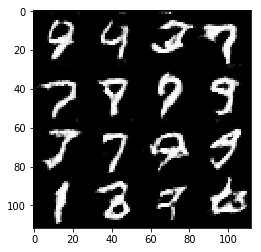

Epoch 2/2... Discriminator Loss: 2.3118... Generator Loss: 0.2731
Epoch 2/2... Discriminator Loss: 0.3209... Generator Loss: 2.1679
Epoch 2/2... Discriminator Loss: 0.1359... Generator Loss: 3.1053
Epoch 2/2... Discriminator Loss: 0.1485... Generator Loss: 2.3378
Epoch 2/2... Discriminator Loss: 0.1172... Generator Loss: 3.2377


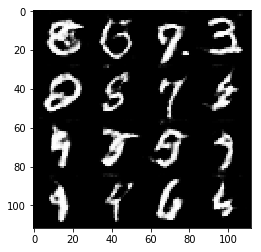

Epoch 2/2... Discriminator Loss: 0.2035... Generator Loss: 2.3055
Epoch 2/2... Discriminator Loss: 0.1422... Generator Loss: 2.6043
Epoch 2/2... Discriminator Loss: 0.1465... Generator Loss: 2.8331
Epoch 2/2... Discriminator Loss: 0.2572... Generator Loss: 2.0097
Epoch 2/2... Discriminator Loss: 0.1665... Generator Loss: 2.7078


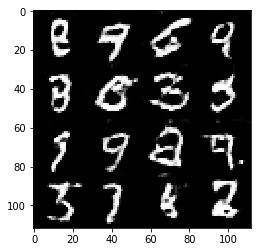

Epoch 2/2... Discriminator Loss: 0.2347... Generator Loss: 2.0085
Epoch 2/2... Discriminator Loss: 0.0342... Generator Loss: 4.3523
Epoch 2/2... Discriminator Loss: 0.2536... Generator Loss: 1.8578
Epoch 2/2... Discriminator Loss: 0.1412... Generator Loss: 2.7142
Epoch 2/2... Discriminator Loss: 0.3334... Generator Loss: 1.5528


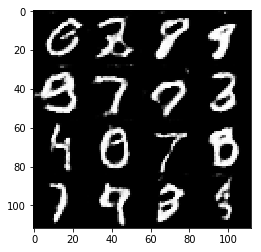

Epoch 2/2... Discriminator Loss: 0.1734... Generator Loss: 3.1455
Epoch 2/2... Discriminator Loss: 0.4719... Generator Loss: 1.7746
Epoch 2/2... Discriminator Loss: 0.4853... Generator Loss: 1.3866
Epoch 2/2... Discriminator Loss: 0.1461... Generator Loss: 2.8389
Epoch 2/2... Discriminator Loss: 0.2602... Generator Loss: 2.5806


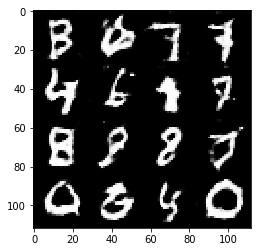

Epoch 2/2... Discriminator Loss: 0.9170... Generator Loss: 0.8074
Epoch 2/2... Discriminator Loss: 0.3778... Generator Loss: 1.6015
Epoch 2/2... Discriminator Loss: 0.1429... Generator Loss: 3.3788
Epoch 2/2... Discriminator Loss: 0.1652... Generator Loss: 2.6486
Epoch 2/2... Discriminator Loss: 0.1637... Generator Loss: 2.4741


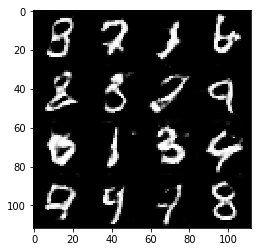

Epoch 2/2... Discriminator Loss: 0.2298... Generator Loss: 2.0438
Epoch 2/2... Discriminator Loss: 0.0767... Generator Loss: 3.8677
Epoch 2/2... Discriminator Loss: 0.1559... Generator Loss: 2.8458
Epoch 2/2... Discriminator Loss: 0.3282... Generator Loss: 1.6961
Epoch 2/2... Discriminator Loss: 0.6270... Generator Loss: 1.6846


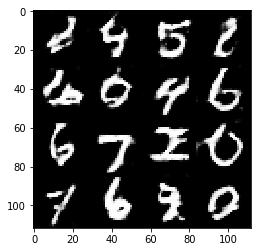

Epoch 2/2... Discriminator Loss: 2.0567... Generator Loss: 0.5046
Epoch 2/2... Discriminator Loss: 0.1554... Generator Loss: 2.9416
Epoch 2/2... Discriminator Loss: 0.1736... Generator Loss: 2.8050
Epoch 2/2... Discriminator Loss: 0.5106... Generator Loss: 1.7284
Epoch 2/2... Discriminator Loss: 0.1219... Generator Loss: 3.6531


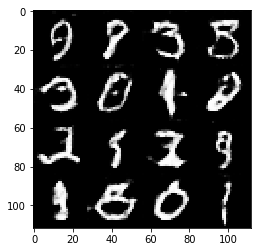

Epoch 2/2... Discriminator Loss: 0.2346... Generator Loss: 4.2568
Epoch 2/2... Discriminator Loss: 0.1125... Generator Loss: 2.9847
Epoch 2/2... Discriminator Loss: 0.1088... Generator Loss: 3.4483
Epoch 2/2... Discriminator Loss: 1.4681... Generator Loss: 0.6258
Epoch 2/2... Discriminator Loss: 0.0779... Generator Loss: 3.2692


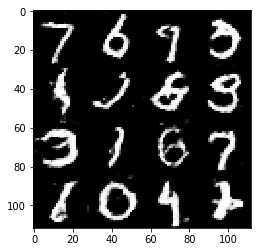

Epoch 2/2... Discriminator Loss: 0.2194... Generator Loss: 2.4161
Epoch 2/2... Discriminator Loss: 0.2949... Generator Loss: 1.7291
Epoch 2/2... Discriminator Loss: 0.2080... Generator Loss: 2.3345
Epoch 2/2... Discriminator Loss: 0.3643... Generator Loss: 1.6319
Epoch 2/2... Discriminator Loss: 0.0921... Generator Loss: 2.9418


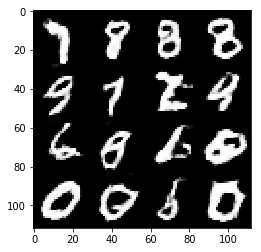

Epoch 2/2... Discriminator Loss: 0.0884... Generator Loss: 3.3037
Epoch 2/2... Discriminator Loss: 1.7007... Generator Loss: 0.3928
Epoch 2/2... Discriminator Loss: 0.1524... Generator Loss: 3.2938
Epoch 2/2... Discriminator Loss: 0.2624... Generator Loss: 1.9376
Epoch 2/2... Discriminator Loss: 0.2871... Generator Loss: 2.0320


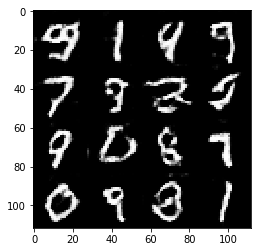

Epoch 2/2... Discriminator Loss: 0.0849... Generator Loss: 3.7759
Epoch 2/2... Discriminator Loss: 0.2532... Generator Loss: 1.8924
Epoch 2/2... Discriminator Loss: 0.1195... Generator Loss: 3.3888
Epoch 2/2... Discriminator Loss: 0.1470... Generator Loss: 2.5975
Epoch 2/2... Discriminator Loss: 0.3112... Generator Loss: 1.7842


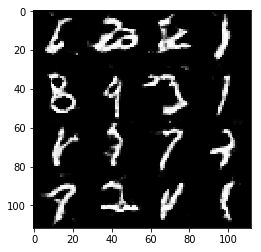

Epoch 2/2... Discriminator Loss: 0.5947... Generator Loss: 1.3325
Epoch 2/2... Discriminator Loss: 0.2466... Generator Loss: 6.4519
Epoch 2/2... Discriminator Loss: 0.2156... Generator Loss: 2.2568
Epoch 2/2... Discriminator Loss: 0.1713... Generator Loss: 3.7211
Epoch 2/2... Discriminator Loss: 0.1131... Generator Loss: 3.0759


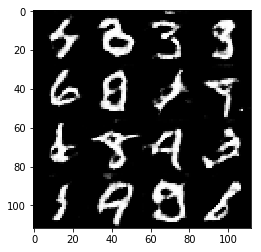

Epoch 2/2... Discriminator Loss: 0.1762... Generator Loss: 2.1999
Epoch 2/2... Discriminator Loss: 0.2280... Generator Loss: 2.5136
Epoch 2/2... Discriminator Loss: 0.1859... Generator Loss: 2.3258
Epoch 2/2... Discriminator Loss: 0.0182... Generator Loss: 6.0928
Epoch 2/2... Discriminator Loss: 0.0477... Generator Loss: 3.5484


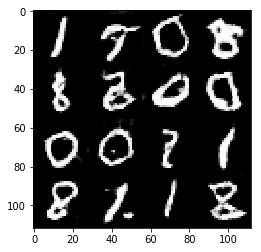

Epoch 2/2... Discriminator Loss: 0.3325... Generator Loss: 1.7383
Epoch 2/2... Discriminator Loss: 0.1327... Generator Loss: 2.6598
Epoch 2/2... Discriminator Loss: 0.0783... Generator Loss: 3.2422
Epoch 2/2... Discriminator Loss: 0.1959... Generator Loss: 2.2594
Epoch 2/2... Discriminator Loss: 0.1475... Generator Loss: 2.9420


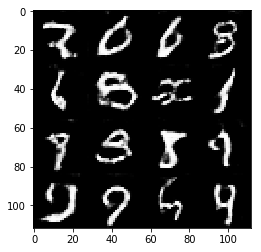

Epoch 2/2... Discriminator Loss: 0.7430... Generator Loss: 1.2453
Epoch 2/2... Discriminator Loss: 0.1102... Generator Loss: 2.7926
Epoch 2/2... Discriminator Loss: 0.1541... Generator Loss: 2.6997
Epoch 2/2... Discriminator Loss: 0.4318... Generator Loss: 1.7979
Epoch 2/2... Discriminator Loss: 0.1164... Generator Loss: 3.0029


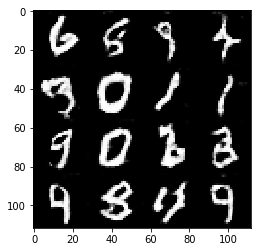

Epoch 2/2... Discriminator Loss: 0.3337... Generator Loss: 1.8024
Epoch 2/2... Discriminator Loss: 0.5360... Generator Loss: 1.2106
Epoch 2/2... Discriminator Loss: 0.0551... Generator Loss: 4.8816
Epoch 2/2... Discriminator Loss: 0.1843... Generator Loss: 2.9780
Epoch 2/2... Discriminator Loss: 0.2163... Generator Loss: 2.2682


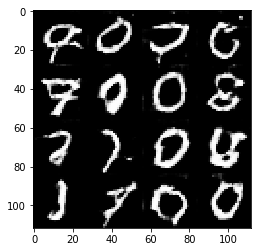

Epoch 2/2... Discriminator Loss: 0.2526... Generator Loss: 2.1594
Epoch 2/2... Discriminator Loss: 0.0761... Generator Loss: 3.1311
Epoch 2/2... Discriminator Loss: 0.0926... Generator Loss: 3.5453
Epoch 2/2... Discriminator Loss: 1.2412... Generator Loss: 0.5672
Epoch 2/2... Discriminator Loss: 0.8218... Generator Loss: 0.9700


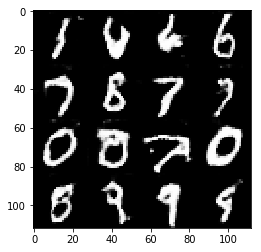

Epoch 2/2... Discriminator Loss: 0.1324... Generator Loss: 3.2573
Epoch 2/2... Discriminator Loss: 0.0976... Generator Loss: 2.9833
Epoch 2/2... Discriminator Loss: 0.2088... Generator Loss: 1.9970
Epoch 2/2... Discriminator Loss: 0.2118... Generator Loss: 2.2997
Epoch 2/2... Discriminator Loss: 0.4460... Generator Loss: 1.4713


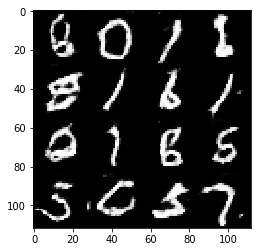

Epoch 2/2... Discriminator Loss: 0.0410... Generator Loss: 5.0411
Epoch 2/2... Discriminator Loss: 0.5237... Generator Loss: 1.9435
Epoch 2/2... Discriminator Loss: 0.3442... Generator Loss: 1.6930
Epoch 2/2... Discriminator Loss: 0.0626... Generator Loss: 3.5852
Epoch 2/2... Discriminator Loss: 0.1446... Generator Loss: 2.5419


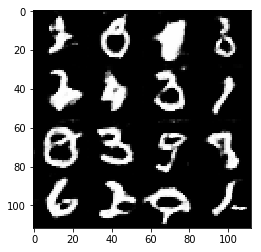

Epoch 2/2... Discriminator Loss: 0.0848... Generator Loss: 4.0505
Epoch 2/2... Discriminator Loss: 0.1776... Generator Loss: 2.2911
Epoch 2/2... Discriminator Loss: 0.4245... Generator Loss: 1.8001
Epoch 2/2... Discriminator Loss: 0.3295... Generator Loss: 1.6835
Epoch 2/2... Discriminator Loss: 0.1519... Generator Loss: 2.8166


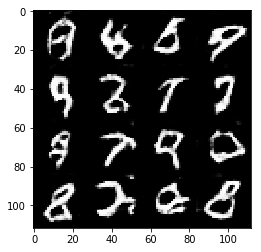

Epoch 2/2... Discriminator Loss: 0.2961... Generator Loss: 2.3633
Epoch 2/2... Discriminator Loss: 0.1877... Generator Loss: 2.4779
Epoch 2/2... Discriminator Loss: 0.1643... Generator Loss: 2.5125
Epoch 2/2... Discriminator Loss: 0.4347... Generator Loss: 1.3920
Epoch 2/2... Discriminator Loss: 0.0962... Generator Loss: 3.3651


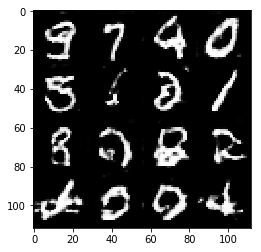

Epoch 2/2... Discriminator Loss: 0.3020... Generator Loss: 1.9906
Epoch 2/2... Discriminator Loss: 0.0609... Generator Loss: 4.1259
Epoch 2/2... Discriminator Loss: 0.9649... Generator Loss: 0.7362
Epoch 2/2... Discriminator Loss: 0.6263... Generator Loss: 0.9822
Epoch 2/2... Discriminator Loss: 0.2406... Generator Loss: 2.3970


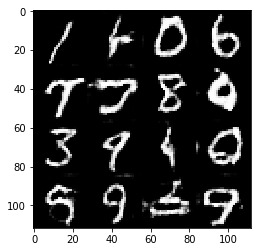

Epoch 2/2... Discriminator Loss: 0.0548... Generator Loss: 4.6633
Epoch 2/2... Discriminator Loss: 0.0900... Generator Loss: 3.2495
Epoch 2/2... Discriminator Loss: 0.1377... Generator Loss: 2.8176
Epoch 2/2... Discriminator Loss: 0.4781... Generator Loss: 1.6621
Epoch 2/2... Discriminator Loss: 0.0375... Generator Loss: 4.7144


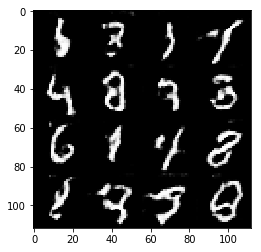

Epoch 2/2... Discriminator Loss: 0.2439... Generator Loss: 2.7375
Epoch 2/2... Discriminator Loss: 0.0978... Generator Loss: 3.4797
Epoch 2/2... Discriminator Loss: 0.1300... Generator Loss: 3.1421
Epoch 2/2... Discriminator Loss: 0.0908... Generator Loss: 6.0879
Epoch 2/2... Discriminator Loss: 0.0607... Generator Loss: 3.5177


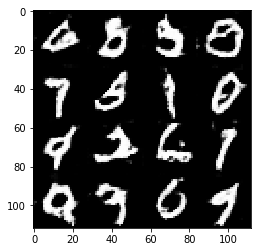

Epoch 2/2... Discriminator Loss: 0.5342... Generator Loss: 1.4542
Epoch 2/2... Discriminator Loss: 0.0437... Generator Loss: 4.6493
Epoch 2/2... Discriminator Loss: 0.1576... Generator Loss: 4.4797
Epoch 2/2... Discriminator Loss: 0.1296... Generator Loss: 3.5990
Epoch 2/2... Discriminator Loss: 0.1723... Generator Loss: 2.6785


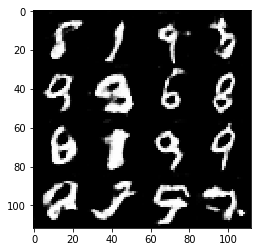

Epoch 2/2... Discriminator Loss: 0.1456... Generator Loss: 3.0350
Epoch 2/2... Discriminator Loss: 0.2170... Generator Loss: 2.6681
Epoch 2/2... Discriminator Loss: 0.0520... Generator Loss: 4.1965
Epoch 2/2... Discriminator Loss: 0.7699... Generator Loss: 1.1879
Epoch 2/2... Discriminator Loss: 0.0498... Generator Loss: 4.9963


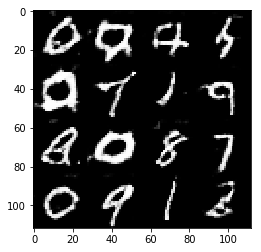

Epoch 2/2... Discriminator Loss: 0.0862... Generator Loss: 3.2266
Epoch 2/2... Discriminator Loss: 0.2154... Generator Loss: 1.9133
Epoch 2/2... Discriminator Loss: 0.1800... Generator Loss: 2.2194
Epoch 2/2... Discriminator Loss: 0.2296... Generator Loss: 2.0949
Epoch 2/2... Discriminator Loss: 0.1311... Generator Loss: 2.8066


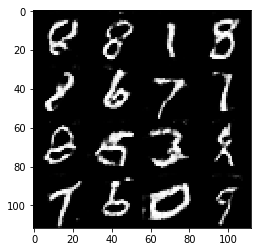

Epoch 2/2... Discriminator Loss: 0.2805... Generator Loss: 2.3625
Epoch 2/2... Discriminator Loss: 0.2927... Generator Loss: 2.2146
Epoch 2/2... Discriminator Loss: 0.6695... Generator Loss: 1.1588
Epoch 2/2... Discriminator Loss: 0.0781... Generator Loss: 4.7781
Epoch 2/2... Discriminator Loss: 0.8883... Generator Loss: 1.8071


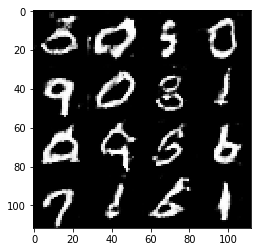

Epoch 2/2... Discriminator Loss: 0.0787... Generator Loss: 3.4966
Epoch 2/2... Discriminator Loss: 0.7122... Generator Loss: 6.2770
Epoch 2/2... Discriminator Loss: 0.8068... Generator Loss: 5.8716
Epoch 2/2... Discriminator Loss: 0.8489... Generator Loss: 1.1306
Epoch 2/2... Discriminator Loss: 0.3825... Generator Loss: 4.4003


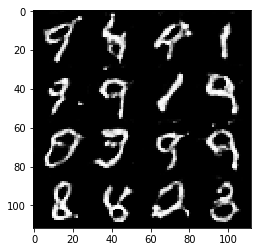

Epoch 2/2... Discriminator Loss: 0.0413... Generator Loss: 4.1172
Epoch 2/2... Discriminator Loss: 0.1746... Generator Loss: 2.7916
Epoch 2/2... Discriminator Loss: 0.1002... Generator Loss: 3.2319
Epoch 2/2... Discriminator Loss: 0.0422... Generator Loss: 4.2602
Epoch 2/2... Discriminator Loss: 0.1165... Generator Loss: 2.8584


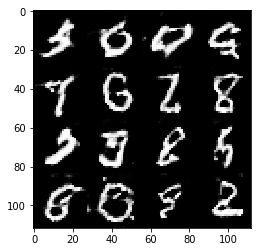

In [132]:
batch_size = 16
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.1847... Generator Loss: 2.1146
Epoch 1/1... Discriminator Loss: 0.3894... Generator Loss: 1.3258
Epoch 1/1... Discriminator Loss: 0.2054... Generator Loss: 1.9950
Epoch 1/1... Discriminator Loss: 0.1576... Generator Loss: 2.4197
Epoch 1/1... Discriminator Loss: 0.9648... Generator Loss: 10.9248


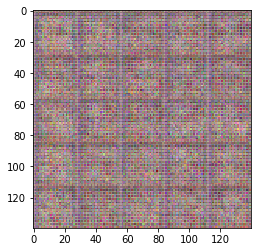

Epoch 1/1... Discriminator Loss: 0.3033... Generator Loss: 1.7895
Epoch 1/1... Discriminator Loss: 0.0799... Generator Loss: 3.2710
Epoch 1/1... Discriminator Loss: 0.1398... Generator Loss: 2.6296
Epoch 1/1... Discriminator Loss: 0.2861... Generator Loss: 2.1221
Epoch 1/1... Discriminator Loss: 0.4115... Generator Loss: 1.7580


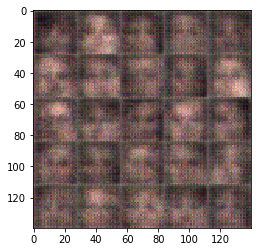

Epoch 1/1... Discriminator Loss: 0.4404... Generator Loss: 3.9777
Epoch 1/1... Discriminator Loss: 0.3342... Generator Loss: 1.5660
Epoch 1/1... Discriminator Loss: 0.5116... Generator Loss: 1.2781
Epoch 1/1... Discriminator Loss: 0.2507... Generator Loss: 3.2302
Epoch 1/1... Discriminator Loss: 0.4197... Generator Loss: 4.5353


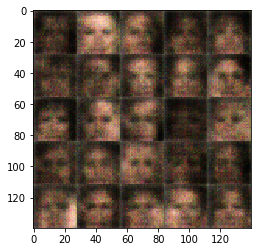

Epoch 1/1... Discriminator Loss: 0.2202... Generator Loss: 2.3560
Epoch 1/1... Discriminator Loss: 2.7623... Generator Loss: 0.1159
Epoch 1/1... Discriminator Loss: 0.2941... Generator Loss: 1.8828
Epoch 1/1... Discriminator Loss: 0.2061... Generator Loss: 2.3075
Epoch 1/1... Discriminator Loss: 0.2731... Generator Loss: 2.1207


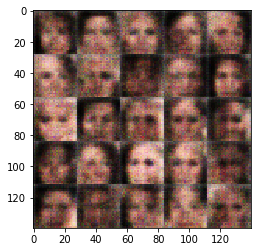

Epoch 1/1... Discriminator Loss: 0.2774... Generator Loss: 3.8420
Epoch 1/1... Discriminator Loss: 0.3877... Generator Loss: 1.5257
Epoch 1/1... Discriminator Loss: 0.2250... Generator Loss: 2.3353
Epoch 1/1... Discriminator Loss: 0.3653... Generator Loss: 4.1081
Epoch 1/1... Discriminator Loss: 0.2574... Generator Loss: 2.2166


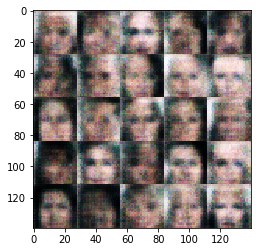

Epoch 1/1... Discriminator Loss: 0.2614... Generator Loss: 2.4955
Epoch 1/1... Discriminator Loss: 0.3774... Generator Loss: 5.0081
Epoch 1/1... Discriminator Loss: 0.6015... Generator Loss: 3.7340
Epoch 1/1... Discriminator Loss: 0.5922... Generator Loss: 1.0875
Epoch 1/1... Discriminator Loss: 0.3743... Generator Loss: 1.7242


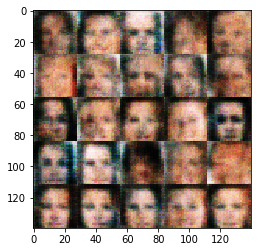

Epoch 1/1... Discriminator Loss: 0.3576... Generator Loss: 2.1454
Epoch 1/1... Discriminator Loss: 0.4042... Generator Loss: 3.0671
Epoch 1/1... Discriminator Loss: 0.2435... Generator Loss: 1.9637
Epoch 1/1... Discriminator Loss: 0.2222... Generator Loss: 2.5270
Epoch 1/1... Discriminator Loss: 0.3548... Generator Loss: 1.8482


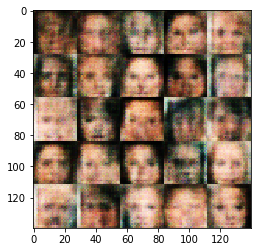

Epoch 1/1... Discriminator Loss: 0.3790... Generator Loss: 1.4921
Epoch 1/1... Discriminator Loss: 0.3376... Generator Loss: 2.0139
Epoch 1/1... Discriminator Loss: 0.3012... Generator Loss: 1.8658
Epoch 1/1... Discriminator Loss: 0.4094... Generator Loss: 1.5447
Epoch 1/1... Discriminator Loss: 0.3170... Generator Loss: 2.0392


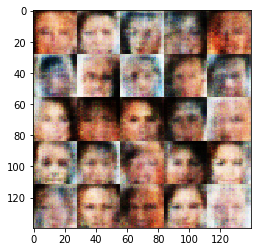

Epoch 1/1... Discriminator Loss: 0.5082... Generator Loss: 1.2845
Epoch 1/1... Discriminator Loss: 0.6655... Generator Loss: 0.9454
Epoch 1/1... Discriminator Loss: 1.3552... Generator Loss: 0.4180
Epoch 1/1... Discriminator Loss: 0.3434... Generator Loss: 3.2320
Epoch 1/1... Discriminator Loss: 0.4212... Generator Loss: 1.4811


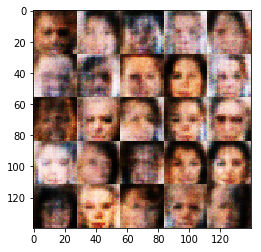

Epoch 1/1... Discriminator Loss: 0.4772... Generator Loss: 1.1707
Epoch 1/1... Discriminator Loss: 0.9898... Generator Loss: 0.7325
Epoch 1/1... Discriminator Loss: 0.6305... Generator Loss: 2.0388
Epoch 1/1... Discriminator Loss: 0.7131... Generator Loss: 3.0889
Epoch 1/1... Discriminator Loss: 0.8352... Generator Loss: 0.7467


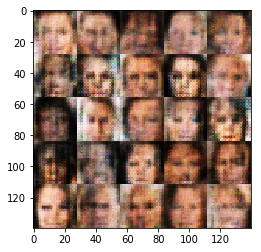

Epoch 1/1... Discriminator Loss: 0.4382... Generator Loss: 1.6197
Epoch 1/1... Discriminator Loss: 1.2071... Generator Loss: 0.4237
Epoch 1/1... Discriminator Loss: 0.8863... Generator Loss: 0.7842
Epoch 1/1... Discriminator Loss: 0.4652... Generator Loss: 1.4583
Epoch 1/1... Discriminator Loss: 0.4132... Generator Loss: 1.8490


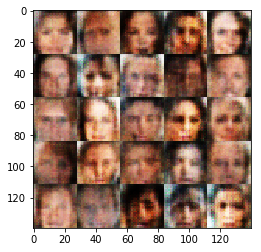

Epoch 1/1... Discriminator Loss: 0.5965... Generator Loss: 1.1479
Epoch 1/1... Discriminator Loss: 0.3143... Generator Loss: 2.3435
Epoch 1/1... Discriminator Loss: 0.4762... Generator Loss: 2.9408
Epoch 1/1... Discriminator Loss: 0.4578... Generator Loss: 1.4423
Epoch 1/1... Discriminator Loss: 0.3601... Generator Loss: 2.2295


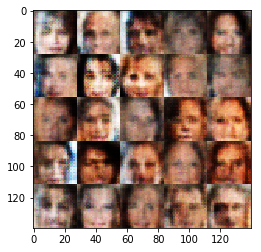

Epoch 1/1... Discriminator Loss: 0.4511... Generator Loss: 1.5254
Epoch 1/1... Discriminator Loss: 0.3361... Generator Loss: 2.4222
Epoch 1/1... Discriminator Loss: 0.5746... Generator Loss: 1.1153
Epoch 1/1... Discriminator Loss: 0.4846... Generator Loss: 1.3168
Epoch 1/1... Discriminator Loss: 0.5986... Generator Loss: 2.8879


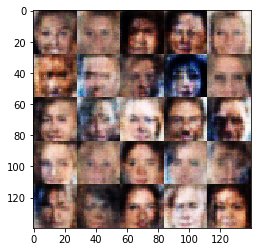

Epoch 1/1... Discriminator Loss: 0.7549... Generator Loss: 2.9612
Epoch 1/1... Discriminator Loss: 1.0476... Generator Loss: 4.1008
Epoch 1/1... Discriminator Loss: 0.7401... Generator Loss: 0.8982
Epoch 1/1... Discriminator Loss: 0.4013... Generator Loss: 1.8133
Epoch 1/1... Discriminator Loss: 0.5567... Generator Loss: 2.2691


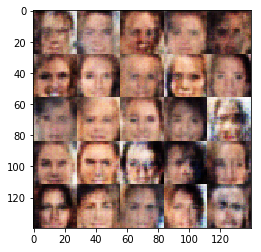

Epoch 1/1... Discriminator Loss: 0.4199... Generator Loss: 1.7103
Epoch 1/1... Discriminator Loss: 0.4453... Generator Loss: 2.9100
Epoch 1/1... Discriminator Loss: 0.9083... Generator Loss: 3.1938
Epoch 1/1... Discriminator Loss: 0.4760... Generator Loss: 1.7942
Epoch 1/1... Discriminator Loss: 0.3986... Generator Loss: 2.0867


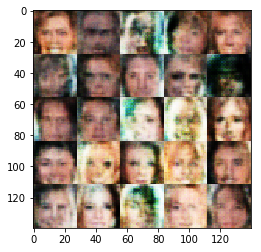

Epoch 1/1... Discriminator Loss: 0.5509... Generator Loss: 2.3607
Epoch 1/1... Discriminator Loss: 1.4233... Generator Loss: 0.3463
Epoch 1/1... Discriminator Loss: 0.6856... Generator Loss: 0.9904
Epoch 1/1... Discriminator Loss: 0.5290... Generator Loss: 1.3586
Epoch 1/1... Discriminator Loss: 0.5391... Generator Loss: 1.2309


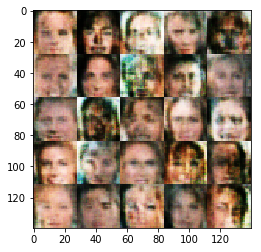

Epoch 1/1... Discriminator Loss: 0.7150... Generator Loss: 0.8462
Epoch 1/1... Discriminator Loss: 0.9217... Generator Loss: 0.6106
Epoch 1/1... Discriminator Loss: 0.4226... Generator Loss: 1.4900
Epoch 1/1... Discriminator Loss: 0.5677... Generator Loss: 1.3473
Epoch 1/1... Discriminator Loss: 1.0765... Generator Loss: 0.5523


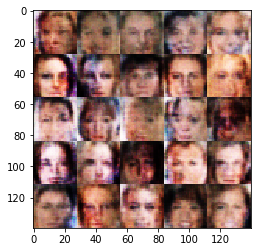

Epoch 1/1... Discriminator Loss: 0.6759... Generator Loss: 0.9701
Epoch 1/1... Discriminator Loss: 0.6777... Generator Loss: 0.9899
Epoch 1/1... Discriminator Loss: 0.9685... Generator Loss: 0.6109
Epoch 1/1... Discriminator Loss: 0.3080... Generator Loss: 2.3823
Epoch 1/1... Discriminator Loss: 0.5849... Generator Loss: 1.3167


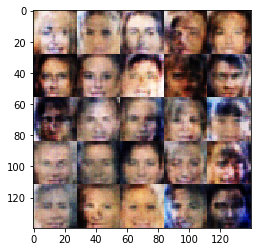

Epoch 1/1... Discriminator Loss: 1.1549... Generator Loss: 0.5230
Epoch 1/1... Discriminator Loss: 0.5526... Generator Loss: 2.0562
Epoch 1/1... Discriminator Loss: 1.0651... Generator Loss: 0.5134
Epoch 1/1... Discriminator Loss: 0.4568... Generator Loss: 1.8524
Epoch 1/1... Discriminator Loss: 0.5163... Generator Loss: 2.7660


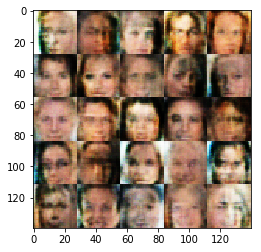

Epoch 1/1... Discriminator Loss: 0.5343... Generator Loss: 1.2208
Epoch 1/1... Discriminator Loss: 0.6291... Generator Loss: 1.0783
Epoch 1/1... Discriminator Loss: 1.1664... Generator Loss: 3.2858
Epoch 1/1... Discriminator Loss: 0.8340... Generator Loss: 0.6934
Epoch 1/1... Discriminator Loss: 0.4085... Generator Loss: 1.5372


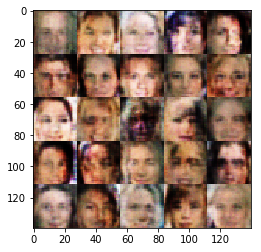

Epoch 1/1... Discriminator Loss: 0.6132... Generator Loss: 1.0460
Epoch 1/1... Discriminator Loss: 0.5511... Generator Loss: 1.2665
Epoch 1/1... Discriminator Loss: 0.4713... Generator Loss: 1.3772
Epoch 1/1... Discriminator Loss: 0.4033... Generator Loss: 1.6400
Epoch 1/1... Discriminator Loss: 0.4385... Generator Loss: 1.5342


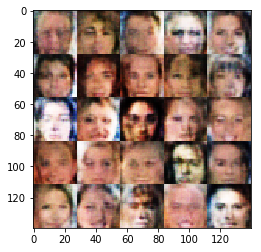

Epoch 1/1... Discriminator Loss: 0.4669... Generator Loss: 1.4396
Epoch 1/1... Discriminator Loss: 0.4574... Generator Loss: 2.5074
Epoch 1/1... Discriminator Loss: 0.4528... Generator Loss: 2.0634
Epoch 1/1... Discriminator Loss: 0.5985... Generator Loss: 1.0071
Epoch 1/1... Discriminator Loss: 0.5853... Generator Loss: 2.2428


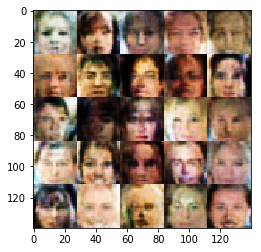

Epoch 1/1... Discriminator Loss: 1.1396... Generator Loss: 0.5406
Epoch 1/1... Discriminator Loss: 0.5932... Generator Loss: 1.3801
Epoch 1/1... Discriminator Loss: 0.5173... Generator Loss: 1.2922
Epoch 1/1... Discriminator Loss: 1.0938... Generator Loss: 0.5119
Epoch 1/1... Discriminator Loss: 0.6035... Generator Loss: 1.4883


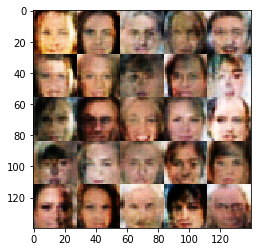

Epoch 1/1... Discriminator Loss: 0.4808... Generator Loss: 2.3905
Epoch 1/1... Discriminator Loss: 0.8443... Generator Loss: 0.7481
Epoch 1/1... Discriminator Loss: 0.9224... Generator Loss: 0.6659
Epoch 1/1... Discriminator Loss: 0.5651... Generator Loss: 1.0455
Epoch 1/1... Discriminator Loss: 0.6033... Generator Loss: 1.1989


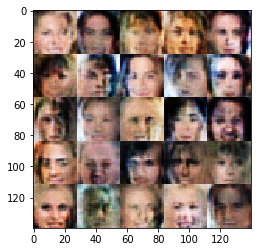

Epoch 1/1... Discriminator Loss: 0.4843... Generator Loss: 1.4166
Epoch 1/1... Discriminator Loss: 0.6117... Generator Loss: 1.3220
Epoch 1/1... Discriminator Loss: 0.5602... Generator Loss: 1.4312
Epoch 1/1... Discriminator Loss: 1.0171... Generator Loss: 0.5390
Epoch 1/1... Discriminator Loss: 1.0565... Generator Loss: 0.5403


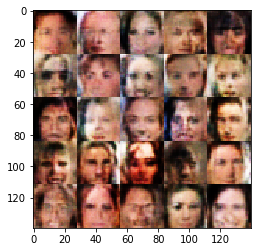

Epoch 1/1... Discriminator Loss: 0.8378... Generator Loss: 3.2657
Epoch 1/1... Discriminator Loss: 0.4978... Generator Loss: 1.4145
Epoch 1/1... Discriminator Loss: 0.5064... Generator Loss: 1.6404
Epoch 1/1... Discriminator Loss: 0.7790... Generator Loss: 0.8476
Epoch 1/1... Discriminator Loss: 0.5723... Generator Loss: 1.2846


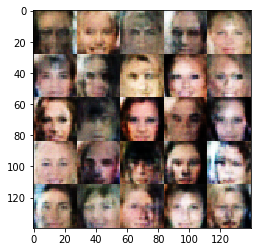

Epoch 1/1... Discriminator Loss: 0.8642... Generator Loss: 0.6717
Epoch 1/1... Discriminator Loss: 0.4454... Generator Loss: 1.4685
Epoch 1/1... Discriminator Loss: 0.3663... Generator Loss: 1.5976
Epoch 1/1... Discriminator Loss: 1.2725... Generator Loss: 0.4010
Epoch 1/1... Discriminator Loss: 0.6371... Generator Loss: 1.2656


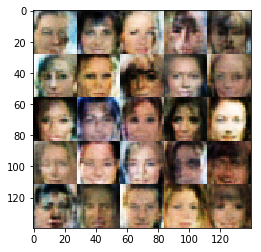

Epoch 1/1... Discriminator Loss: 0.7080... Generator Loss: 0.9102
Epoch 1/1... Discriminator Loss: 0.7504... Generator Loss: 0.7833
Epoch 1/1... Discriminator Loss: 0.8250... Generator Loss: 2.6259
Epoch 1/1... Discriminator Loss: 0.8873... Generator Loss: 0.7000
Epoch 1/1... Discriminator Loss: 0.7380... Generator Loss: 0.8935


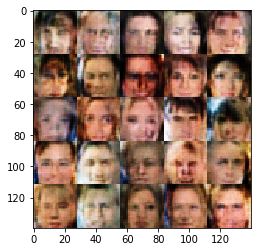

Epoch 1/1... Discriminator Loss: 0.4396... Generator Loss: 1.4058
Epoch 1/1... Discriminator Loss: 0.5429... Generator Loss: 1.1952
Epoch 1/1... Discriminator Loss: 0.5333... Generator Loss: 1.3576
Epoch 1/1... Discriminator Loss: 0.3497... Generator Loss: 2.8560
Epoch 1/1... Discriminator Loss: 0.8774... Generator Loss: 0.7054


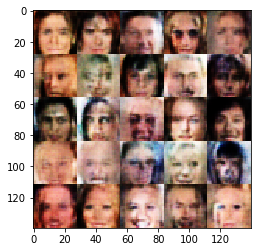

Epoch 1/1... Discriminator Loss: 0.5946... Generator Loss: 2.2000
Epoch 1/1... Discriminator Loss: 0.8229... Generator Loss: 0.8474
Epoch 1/1... Discriminator Loss: 0.4095... Generator Loss: 1.4121
Epoch 1/1... Discriminator Loss: 0.7342... Generator Loss: 0.8803
Epoch 1/1... Discriminator Loss: 0.6776... Generator Loss: 0.9384


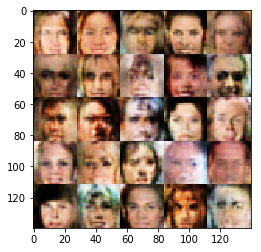

Epoch 1/1... Discriminator Loss: 0.7049... Generator Loss: 0.9741
Epoch 1/1... Discriminator Loss: 1.0710... Generator Loss: 0.4732
Epoch 1/1... Discriminator Loss: 1.0526... Generator Loss: 0.5356
Epoch 1/1... Discriminator Loss: 1.2436... Generator Loss: 0.4755
Epoch 1/1... Discriminator Loss: 0.6663... Generator Loss: 1.0056


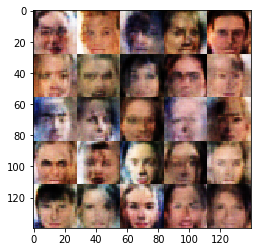

Epoch 1/1... Discriminator Loss: 0.4387... Generator Loss: 1.8174
Epoch 1/1... Discriminator Loss: 0.5417... Generator Loss: 1.2329
Epoch 1/1... Discriminator Loss: 0.5442... Generator Loss: 1.1490
Epoch 1/1... Discriminator Loss: 0.4730... Generator Loss: 1.6760
Epoch 1/1... Discriminator Loss: 0.6851... Generator Loss: 1.0415


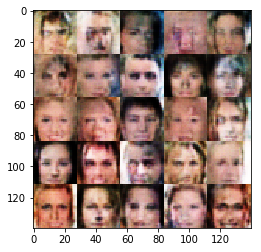

Epoch 1/1... Discriminator Loss: 1.7644... Generator Loss: 0.2417
Epoch 1/1... Discriminator Loss: 0.6882... Generator Loss: 0.8724
Epoch 1/1... Discriminator Loss: 0.6109... Generator Loss: 0.9527
Epoch 1/1... Discriminator Loss: 1.0985... Generator Loss: 0.5070
Epoch 1/1... Discriminator Loss: 0.3139... Generator Loss: 1.8278


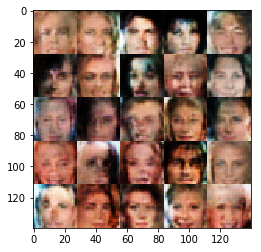

Epoch 1/1... Discriminator Loss: 0.8589... Generator Loss: 0.7463
Epoch 1/1... Discriminator Loss: 0.6750... Generator Loss: 0.9633
Epoch 1/1... Discriminator Loss: 1.0451... Generator Loss: 0.6758
Epoch 1/1... Discriminator Loss: 0.4984... Generator Loss: 1.5852
Epoch 1/1... Discriminator Loss: 0.7966... Generator Loss: 0.7537


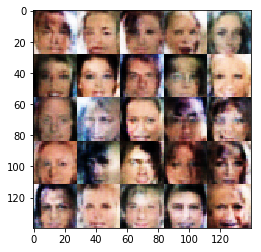

Epoch 1/1... Discriminator Loss: 0.3832... Generator Loss: 1.3376
Epoch 1/1... Discriminator Loss: 0.5679... Generator Loss: 1.8670
Epoch 1/1... Discriminator Loss: 0.3225... Generator Loss: 1.5119
Epoch 1/1... Discriminator Loss: 0.8621... Generator Loss: 0.7418
Epoch 1/1... Discriminator Loss: 0.4074... Generator Loss: 1.9324


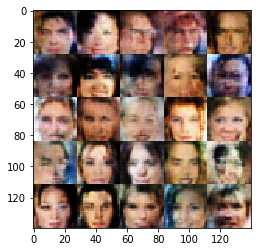

Epoch 1/1... Discriminator Loss: 0.6962... Generator Loss: 0.8627
Epoch 1/1... Discriminator Loss: 1.9941... Generator Loss: 0.2143
Epoch 1/1... Discriminator Loss: 0.8007... Generator Loss: 0.7820
Epoch 1/1... Discriminator Loss: 0.4638... Generator Loss: 1.7558
Epoch 1/1... Discriminator Loss: 0.3908... Generator Loss: 2.3709


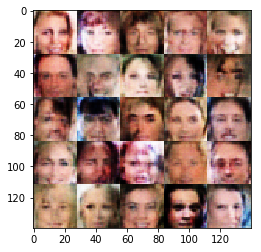

Epoch 1/1... Discriminator Loss: 0.4462... Generator Loss: 1.2841
Epoch 1/1... Discriminator Loss: 0.7985... Generator Loss: 0.8299
Epoch 1/1... Discriminator Loss: 0.6503... Generator Loss: 1.0545
Epoch 1/1... Discriminator Loss: 0.4074... Generator Loss: 1.7086
Epoch 1/1... Discriminator Loss: 0.4138... Generator Loss: 2.2919


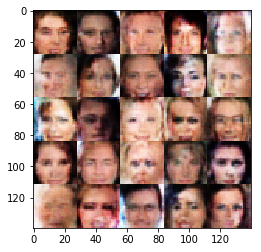

Epoch 1/1... Discriminator Loss: 0.3779... Generator Loss: 1.6780
Epoch 1/1... Discriminator Loss: 0.5350... Generator Loss: 1.1232
Epoch 1/1... Discriminator Loss: 0.3070... Generator Loss: 1.8709
Epoch 1/1... Discriminator Loss: 1.5013... Generator Loss: 0.3558
Epoch 1/1... Discriminator Loss: 0.4318... Generator Loss: 1.4705


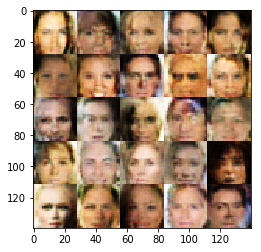

Epoch 1/1... Discriminator Loss: 0.5626... Generator Loss: 1.1206
Epoch 1/1... Discriminator Loss: 1.0654... Generator Loss: 0.5643
Epoch 1/1... Discriminator Loss: 0.9392... Generator Loss: 0.6188
Epoch 1/1... Discriminator Loss: 0.5751... Generator Loss: 1.0248
Epoch 1/1... Discriminator Loss: 0.3869... Generator Loss: 1.7899


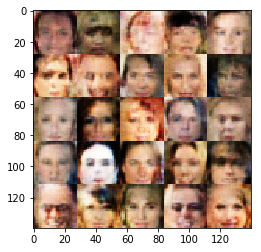

Epoch 1/1... Discriminator Loss: 0.8379... Generator Loss: 4.2601
Epoch 1/1... Discriminator Loss: 0.4075... Generator Loss: 1.4425
Epoch 1/1... Discriminator Loss: 1.1315... Generator Loss: 0.4657
Epoch 1/1... Discriminator Loss: 0.7179... Generator Loss: 0.8292
Epoch 1/1... Discriminator Loss: 0.4442... Generator Loss: 1.4128


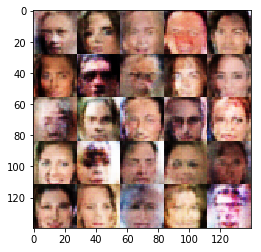

Epoch 1/1... Discriminator Loss: 0.2998... Generator Loss: 1.9141
Epoch 1/1... Discriminator Loss: 1.1621... Generator Loss: 0.5003
Epoch 1/1... Discriminator Loss: 0.5370... Generator Loss: 1.8025
Epoch 1/1... Discriminator Loss: 0.2153... Generator Loss: 2.2045
Epoch 1/1... Discriminator Loss: 1.4724... Generator Loss: 0.3352


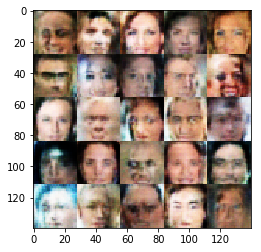

Epoch 1/1... Discriminator Loss: 1.0662... Generator Loss: 0.5123
Epoch 1/1... Discriminator Loss: 1.1919... Generator Loss: 0.5138
Epoch 1/1... Discriminator Loss: 0.5515... Generator Loss: 1.0955
Epoch 1/1... Discriminator Loss: 1.9024... Generator Loss: 0.2582
Epoch 1/1... Discriminator Loss: 1.2239... Generator Loss: 0.4323


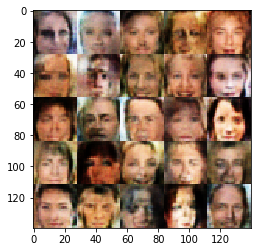

Epoch 1/1... Discriminator Loss: 0.4986... Generator Loss: 1.4016
Epoch 1/1... Discriminator Loss: 0.5319... Generator Loss: 1.2093
Epoch 1/1... Discriminator Loss: 0.3384... Generator Loss: 2.1277
Epoch 1/1... Discriminator Loss: 0.9613... Generator Loss: 0.6036
Epoch 1/1... Discriminator Loss: 0.6721... Generator Loss: 0.9075


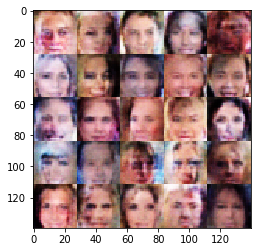

Epoch 1/1... Discriminator Loss: 0.7510... Generator Loss: 0.7991
Epoch 1/1... Discriminator Loss: 2.0001... Generator Loss: 0.2141
Epoch 1/1... Discriminator Loss: 0.8343... Generator Loss: 0.7377
Epoch 1/1... Discriminator Loss: 0.9978... Generator Loss: 0.5727
Epoch 1/1... Discriminator Loss: 0.6860... Generator Loss: 0.8546


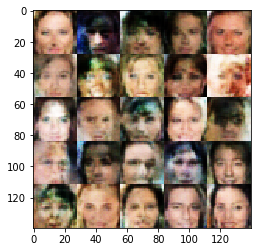

Epoch 1/1... Discriminator Loss: 0.5256... Generator Loss: 1.1615
Epoch 1/1... Discriminator Loss: 0.8231... Generator Loss: 3.2222
Epoch 1/1... Discriminator Loss: 0.5593... Generator Loss: 1.1748
Epoch 1/1... Discriminator Loss: 1.0650... Generator Loss: 0.5502
Epoch 1/1... Discriminator Loss: 0.8501... Generator Loss: 0.7068


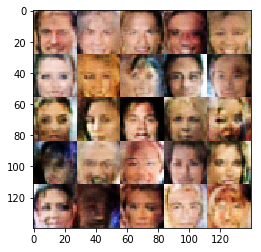

Epoch 1/1... Discriminator Loss: 0.7720... Generator Loss: 0.8351
Epoch 1/1... Discriminator Loss: 0.4956... Generator Loss: 1.3027
Epoch 1/1... Discriminator Loss: 1.1893... Generator Loss: 0.4404
Epoch 1/1... Discriminator Loss: 0.8854... Generator Loss: 0.7490
Epoch 1/1... Discriminator Loss: 0.4699... Generator Loss: 1.3450


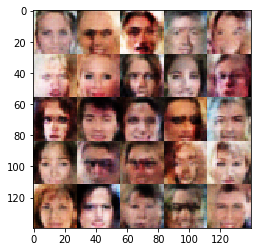

Epoch 1/1... Discriminator Loss: 0.5494... Generator Loss: 2.5232
Epoch 1/1... Discriminator Loss: 0.9248... Generator Loss: 0.6484
Epoch 1/1... Discriminator Loss: 0.8048... Generator Loss: 0.7846
Epoch 1/1... Discriminator Loss: 0.5252... Generator Loss: 1.2628
Epoch 1/1... Discriminator Loss: 0.5550... Generator Loss: 1.0957


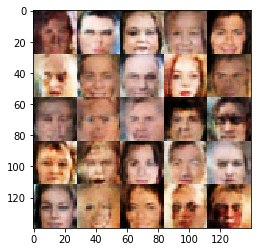

Epoch 1/1... Discriminator Loss: 0.7487... Generator Loss: 0.8628
Epoch 1/1... Discriminator Loss: 0.8756... Generator Loss: 3.8606
Epoch 1/1... Discriminator Loss: 0.7500... Generator Loss: 0.8325
Epoch 1/1... Discriminator Loss: 0.8475... Generator Loss: 0.8540
Epoch 1/1... Discriminator Loss: 0.4722... Generator Loss: 1.2660


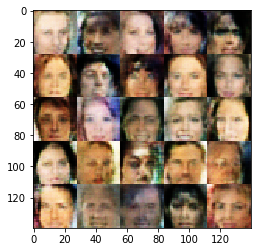

Epoch 1/1... Discriminator Loss: 0.7805... Generator Loss: 0.8030
Epoch 1/1... Discriminator Loss: 0.3766... Generator Loss: 1.7070
Epoch 1/1... Discriminator Loss: 0.6747... Generator Loss: 0.9065
Epoch 1/1... Discriminator Loss: 0.5638... Generator Loss: 1.0868
Epoch 1/1... Discriminator Loss: 0.2487... Generator Loss: 2.0155


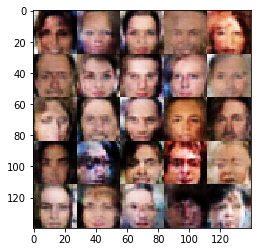

Epoch 1/1... Discriminator Loss: 1.9406... Generator Loss: 0.2060
Epoch 1/1... Discriminator Loss: 0.8288... Generator Loss: 0.8241
Epoch 1/1... Discriminator Loss: 0.7016... Generator Loss: 2.2800
Epoch 1/1... Discriminator Loss: 0.7090... Generator Loss: 0.8327
Epoch 1/1... Discriminator Loss: 0.6562... Generator Loss: 1.1322


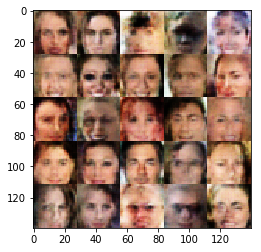

Epoch 1/1... Discriminator Loss: 0.2033... Generator Loss: 2.5693
Epoch 1/1... Discriminator Loss: 0.5783... Generator Loss: 2.6877
Epoch 1/1... Discriminator Loss: 0.6974... Generator Loss: 1.0421
Epoch 1/1... Discriminator Loss: 0.8911... Generator Loss: 2.7383
Epoch 1/1... Discriminator Loss: 0.4848... Generator Loss: 2.1294


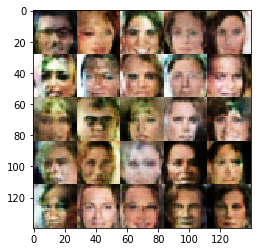

Epoch 1/1... Discriminator Loss: 0.7691... Generator Loss: 2.7748
Epoch 1/1... Discriminator Loss: 0.3591... Generator Loss: 1.8439
Epoch 1/1... Discriminator Loss: 0.7016... Generator Loss: 1.0140
Epoch 1/1... Discriminator Loss: 0.4269... Generator Loss: 1.8803
Epoch 1/1... Discriminator Loss: 0.8186... Generator Loss: 0.7352


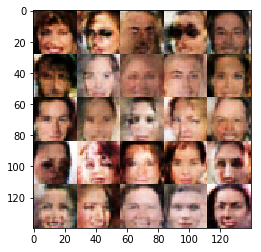

Epoch 1/1... Discriminator Loss: 0.3843... Generator Loss: 1.5320
Epoch 1/1... Discriminator Loss: 1.6702... Generator Loss: 0.3351
Epoch 1/1... Discriminator Loss: 0.3489... Generator Loss: 1.7516
Epoch 1/1... Discriminator Loss: 0.3621... Generator Loss: 1.6749
Epoch 1/1... Discriminator Loss: 0.7100... Generator Loss: 2.2208


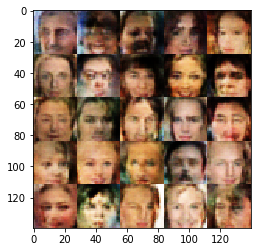

Epoch 1/1... Discriminator Loss: 0.3888... Generator Loss: 1.5890
Epoch 1/1... Discriminator Loss: 0.4231... Generator Loss: 1.5483
Epoch 1/1... Discriminator Loss: 1.2690... Generator Loss: 0.4005
Epoch 1/1... Discriminator Loss: 0.6223... Generator Loss: 1.5468
Epoch 1/1... Discriminator Loss: 0.6595... Generator Loss: 1.0255


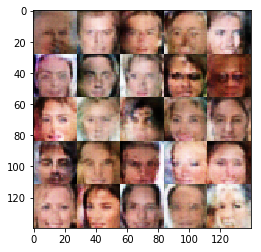

Epoch 1/1... Discriminator Loss: 0.3380... Generator Loss: 1.9998
Epoch 1/1... Discriminator Loss: 0.3983... Generator Loss: 1.5042
Epoch 1/1... Discriminator Loss: 1.1485... Generator Loss: 0.4632
Epoch 1/1... Discriminator Loss: 0.3753... Generator Loss: 2.1633
Epoch 1/1... Discriminator Loss: 0.4228... Generator Loss: 1.4235


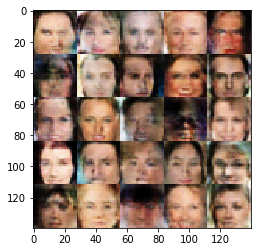

Epoch 1/1... Discriminator Loss: 0.4657... Generator Loss: 1.5087
Epoch 1/1... Discriminator Loss: 0.8341... Generator Loss: 0.7108
Epoch 1/1... Discriminator Loss: 0.8441... Generator Loss: 0.8683
Epoch 1/1... Discriminator Loss: 0.3585... Generator Loss: 1.5152
Epoch 1/1... Discriminator Loss: 0.9810... Generator Loss: 0.5939


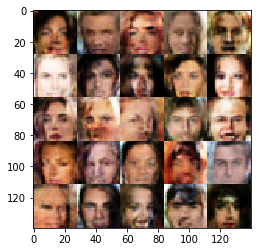

Epoch 1/1... Discriminator Loss: 0.4041... Generator Loss: 1.6581
Epoch 1/1... Discriminator Loss: 0.4586... Generator Loss: 1.4823
Epoch 1/1... Discriminator Loss: 0.3700... Generator Loss: 1.6638
Epoch 1/1... Discriminator Loss: 0.7478... Generator Loss: 0.8179
Epoch 1/1... Discriminator Loss: 0.4878... Generator Loss: 1.2157


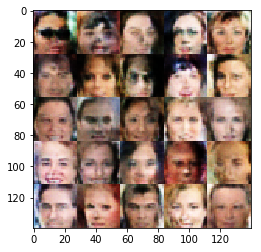

Epoch 1/1... Discriminator Loss: 0.4685... Generator Loss: 1.3706
Epoch 1/1... Discriminator Loss: 0.2044... Generator Loss: 2.3586
Epoch 1/1... Discriminator Loss: 0.5596... Generator Loss: 2.9016
Epoch 1/1... Discriminator Loss: 0.5173... Generator Loss: 2.8968
Epoch 1/1... Discriminator Loss: 0.4466... Generator Loss: 1.3340


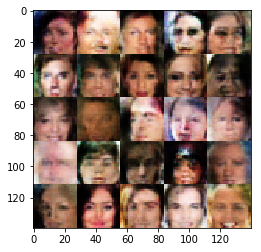

Epoch 1/1... Discriminator Loss: 0.5262... Generator Loss: 1.1660
Epoch 1/1... Discriminator Loss: 0.9072... Generator Loss: 0.8026
Epoch 1/1... Discriminator Loss: 0.5614... Generator Loss: 1.3402
Epoch 1/1... Discriminator Loss: 0.4844... Generator Loss: 1.2825
Epoch 1/1... Discriminator Loss: 0.3434... Generator Loss: 1.6317


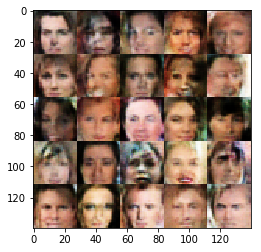

Epoch 1/1... Discriminator Loss: 0.4126... Generator Loss: 1.5339
Epoch 1/1... Discriminator Loss: 0.4077... Generator Loss: 1.4188
Epoch 1/1... Discriminator Loss: 0.5234... Generator Loss: 1.1783
Epoch 1/1... Discriminator Loss: 0.3560... Generator Loss: 1.7133
Epoch 1/1... Discriminator Loss: 1.0245... Generator Loss: 0.7522


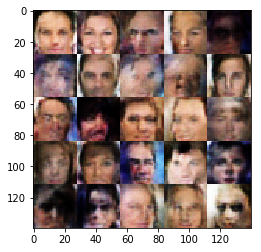

Epoch 1/1... Discriminator Loss: 0.6807... Generator Loss: 1.0475
Epoch 1/1... Discriminator Loss: 0.6934... Generator Loss: 0.9895
Epoch 1/1... Discriminator Loss: 0.5795... Generator Loss: 1.0906
Epoch 1/1... Discriminator Loss: 0.4324... Generator Loss: 1.4585
Epoch 1/1... Discriminator Loss: 0.3422... Generator Loss: 1.5633


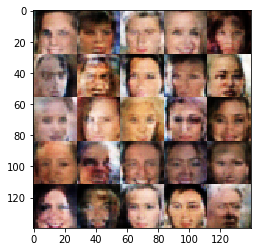

Epoch 1/1... Discriminator Loss: 0.5942... Generator Loss: 1.0738
Epoch 1/1... Discriminator Loss: 0.6183... Generator Loss: 0.9709
Epoch 1/1... Discriminator Loss: 0.3754... Generator Loss: 1.4749
Epoch 1/1... Discriminator Loss: 1.3552... Generator Loss: 0.3470
Epoch 1/1... Discriminator Loss: 0.4750... Generator Loss: 1.6616


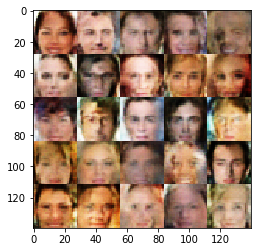

Epoch 1/1... Discriminator Loss: 0.7373... Generator Loss: 0.8463
Epoch 1/1... Discriminator Loss: 1.4454... Generator Loss: 0.3442
Epoch 1/1... Discriminator Loss: 0.9277... Generator Loss: 0.6372
Epoch 1/1... Discriminator Loss: 0.3705... Generator Loss: 1.6328
Epoch 1/1... Discriminator Loss: 0.8949... Generator Loss: 0.6613


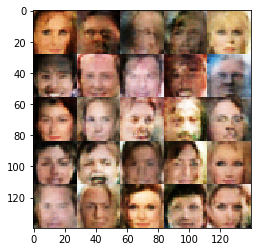

Epoch 1/1... Discriminator Loss: 0.3559... Generator Loss: 1.5472
Epoch 1/1... Discriminator Loss: 0.3447... Generator Loss: 1.5305
Epoch 1/1... Discriminator Loss: 0.5012... Generator Loss: 1.2639
Epoch 1/1... Discriminator Loss: 1.8889... Generator Loss: 0.1921
Epoch 1/1... Discriminator Loss: 3.8338... Generator Loss: 0.0389


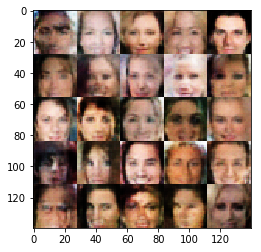

Epoch 1/1... Discriminator Loss: 0.3239... Generator Loss: 2.3918
Epoch 1/1... Discriminator Loss: 0.8663... Generator Loss: 0.6860
Epoch 1/1... Discriminator Loss: 0.4212... Generator Loss: 1.4320
Epoch 1/1... Discriminator Loss: 0.3724... Generator Loss: 1.8106
Epoch 1/1... Discriminator Loss: 0.5006... Generator Loss: 1.2101


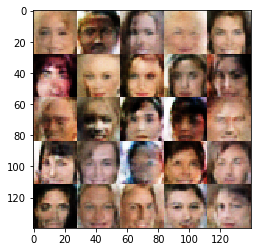

Epoch 1/1... Discriminator Loss: 0.7957... Generator Loss: 0.7795
Epoch 1/1... Discriminator Loss: 0.4079... Generator Loss: 1.6618
Epoch 1/1... Discriminator Loss: 0.5934... Generator Loss: 1.0211
Epoch 1/1... Discriminator Loss: 0.6955... Generator Loss: 0.9138
Epoch 1/1... Discriminator Loss: 0.9668... Generator Loss: 0.5847


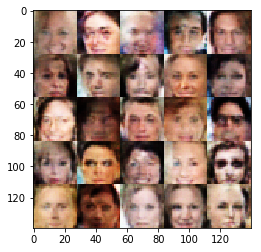

Epoch 1/1... Discriminator Loss: 0.7976... Generator Loss: 0.8384
Epoch 1/1... Discriminator Loss: 0.4863... Generator Loss: 1.2448
Epoch 1/1... Discriminator Loss: 1.5622... Generator Loss: 0.3087
Epoch 1/1... Discriminator Loss: 0.5971... Generator Loss: 1.0060
Epoch 1/1... Discriminator Loss: 0.9416... Generator Loss: 0.5767


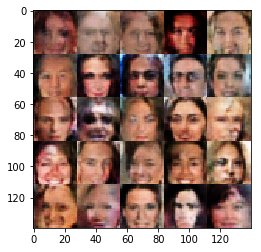

Epoch 1/1... Discriminator Loss: 0.5687... Generator Loss: 1.1421
Epoch 1/1... Discriminator Loss: 0.9148... Generator Loss: 0.6224
Epoch 1/1... Discriminator Loss: 0.3217... Generator Loss: 2.9113
Epoch 1/1... Discriminator Loss: 0.5846... Generator Loss: 3.5709
Epoch 1/1... Discriminator Loss: 0.2732... Generator Loss: 1.8672


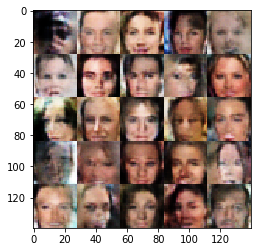

Epoch 1/1... Discriminator Loss: 1.0204... Generator Loss: 0.5224
Epoch 1/1... Discriminator Loss: 0.4679... Generator Loss: 1.3894
Epoch 1/1... Discriminator Loss: 0.3915... Generator Loss: 1.7955
Epoch 1/1... Discriminator Loss: 1.2168... Generator Loss: 0.4526
Epoch 1/1... Discriminator Loss: 0.3348... Generator Loss: 1.9469


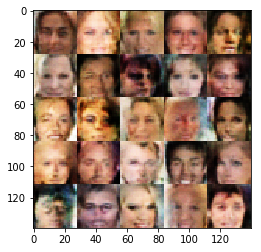

Epoch 1/1... Discriminator Loss: 0.6741... Generator Loss: 0.9728
Epoch 1/1... Discriminator Loss: 0.2849... Generator Loss: 2.3036
Epoch 1/1... Discriminator Loss: 0.4730... Generator Loss: 1.4245
Epoch 1/1... Discriminator Loss: 0.3339... Generator Loss: 1.7930
Epoch 1/1... Discriminator Loss: 0.9789... Generator Loss: 0.6612


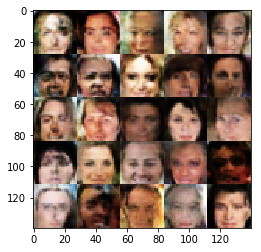

Epoch 1/1... Discriminator Loss: 0.4140... Generator Loss: 1.4977
Epoch 1/1... Discriminator Loss: 0.6985... Generator Loss: 0.8341
Epoch 1/1... Discriminator Loss: 0.7259... Generator Loss: 0.7835
Epoch 1/1... Discriminator Loss: 0.4970... Generator Loss: 1.1613
Epoch 1/1... Discriminator Loss: 1.4536... Generator Loss: 0.4107


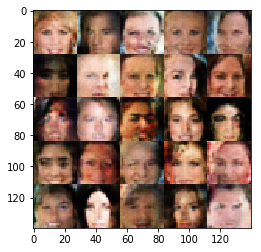

Epoch 1/1... Discriminator Loss: 0.5811... Generator Loss: 1.1369
Epoch 1/1... Discriminator Loss: 0.7302... Generator Loss: 2.3544
Epoch 1/1... Discriminator Loss: 0.6903... Generator Loss: 0.9199
Epoch 1/1... Discriminator Loss: 0.2645... Generator Loss: 3.2373
Epoch 1/1... Discriminator Loss: 0.3273... Generator Loss: 1.8250


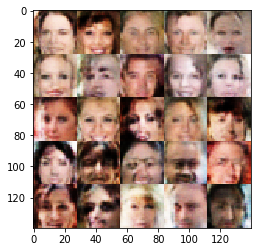

Epoch 1/1... Discriminator Loss: 0.6658... Generator Loss: 0.9558
Epoch 1/1... Discriminator Loss: 0.4821... Generator Loss: 1.2924
Epoch 1/1... Discriminator Loss: 0.7364... Generator Loss: 0.8430
Epoch 1/1... Discriminator Loss: 1.0913... Generator Loss: 0.4924
Epoch 1/1... Discriminator Loss: 0.4865... Generator Loss: 1.2052


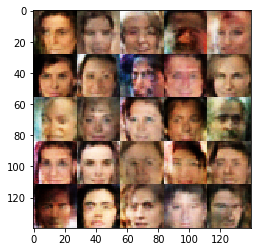

Epoch 1/1... Discriminator Loss: 0.4611... Generator Loss: 1.4071
Epoch 1/1... Discriminator Loss: 0.5903... Generator Loss: 1.0606
Epoch 1/1... Discriminator Loss: 0.3612... Generator Loss: 1.9639
Epoch 1/1... Discriminator Loss: 1.5149... Generator Loss: 0.3079
Epoch 1/1... Discriminator Loss: 0.3191... Generator Loss: 1.5925


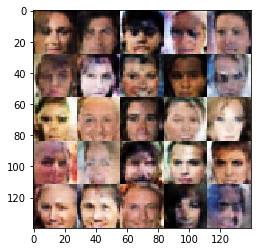

Epoch 1/1... Discriminator Loss: 1.0001... Generator Loss: 0.6349
Epoch 1/1... Discriminator Loss: 0.9289... Generator Loss: 0.6668
Epoch 1/1... Discriminator Loss: 1.0215... Generator Loss: 3.2568
Epoch 1/1... Discriminator Loss: 0.9227... Generator Loss: 0.5953
Epoch 1/1... Discriminator Loss: 0.3676... Generator Loss: 2.1450


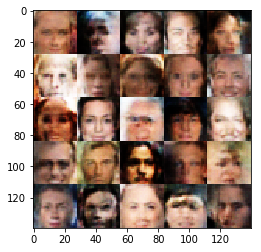

Epoch 1/1... Discriminator Loss: 0.5716... Generator Loss: 1.4180
Epoch 1/1... Discriminator Loss: 0.5887... Generator Loss: 1.1318
Epoch 1/1... Discriminator Loss: 0.4923... Generator Loss: 1.4880
Epoch 1/1... Discriminator Loss: 0.7133... Generator Loss: 0.8915
Epoch 1/1... Discriminator Loss: 0.5962... Generator Loss: 3.6074


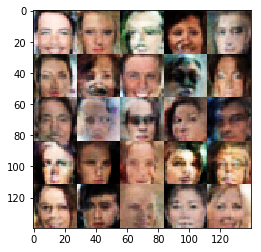

Epoch 1/1... Discriminator Loss: 0.3452... Generator Loss: 2.5537
Epoch 1/1... Discriminator Loss: 0.4913... Generator Loss: 1.1860
Epoch 1/1... Discriminator Loss: 0.3898... Generator Loss: 1.6784
Epoch 1/1... Discriminator Loss: 1.1708... Generator Loss: 0.5524
Epoch 1/1... Discriminator Loss: 0.4132... Generator Loss: 1.4546


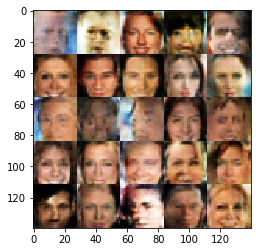

Epoch 1/1... Discriminator Loss: 0.3086... Generator Loss: 3.2335
Epoch 1/1... Discriminator Loss: 0.4561... Generator Loss: 1.2585
Epoch 1/1... Discriminator Loss: 1.0152... Generator Loss: 0.5447
Epoch 1/1... Discriminator Loss: 0.2597... Generator Loss: 1.7548
Epoch 1/1... Discriminator Loss: 0.5300... Generator Loss: 1.2233


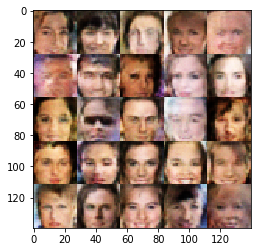

Epoch 1/1... Discriminator Loss: 0.9408... Generator Loss: 0.6377
Epoch 1/1... Discriminator Loss: 0.3540... Generator Loss: 1.8106
Epoch 1/1... Discriminator Loss: 0.4641... Generator Loss: 1.3745
Epoch 1/1... Discriminator Loss: 0.3922... Generator Loss: 2.7065
Epoch 1/1... Discriminator Loss: 0.4808... Generator Loss: 1.2238


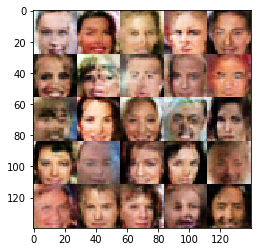

Epoch 1/1... Discriminator Loss: 0.4783... Generator Loss: 1.3572
Epoch 1/1... Discriminator Loss: 0.3686... Generator Loss: 1.5109
Epoch 1/1... Discriminator Loss: 0.4399... Generator Loss: 1.3210
Epoch 1/1... Discriminator Loss: 0.4976... Generator Loss: 1.2527
Epoch 1/1... Discriminator Loss: 0.3840... Generator Loss: 1.5332


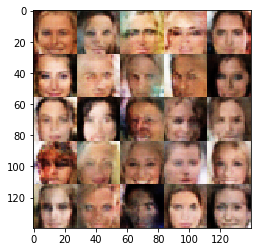

Epoch 1/1... Discriminator Loss: 0.4986... Generator Loss: 3.4910
Epoch 1/1... Discriminator Loss: 1.1334... Generator Loss: 0.4723
Epoch 1/1... Discriminator Loss: 0.9813... Generator Loss: 0.6045
Epoch 1/1... Discriminator Loss: 1.5090... Generator Loss: 0.3414
Epoch 1/1... Discriminator Loss: 0.9069... Generator Loss: 0.6868


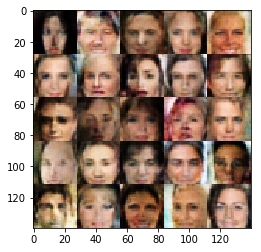

Epoch 1/1... Discriminator Loss: 0.5381... Generator Loss: 1.2936
Epoch 1/1... Discriminator Loss: 0.5372... Generator Loss: 1.2262
Epoch 1/1... Discriminator Loss: 1.1834... Generator Loss: 0.5088
Epoch 1/1... Discriminator Loss: 0.7358... Generator Loss: 0.7985
Epoch 1/1... Discriminator Loss: 0.7968... Generator Loss: 0.7396


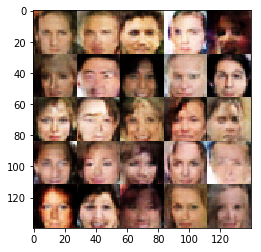

Epoch 1/1... Discriminator Loss: 0.4078... Generator Loss: 1.4900
Epoch 1/1... Discriminator Loss: 0.3587... Generator Loss: 1.7279
Epoch 1/1... Discriminator Loss: 0.6406... Generator Loss: 0.9521
Epoch 1/1... Discriminator Loss: 0.6557... Generator Loss: 0.9368
Epoch 1/1... Discriminator Loss: 0.4383... Generator Loss: 1.3082


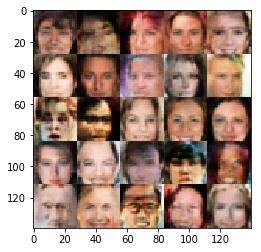

Epoch 1/1... Discriminator Loss: 1.2752... Generator Loss: 0.4923
Epoch 1/1... Discriminator Loss: 1.2037... Generator Loss: 0.4858
Epoch 1/1... Discriminator Loss: 0.5050... Generator Loss: 1.5704
Epoch 1/1... Discriminator Loss: 2.2198... Generator Loss: 5.7783
Epoch 1/1... Discriminator Loss: 0.3513... Generator Loss: 1.5227


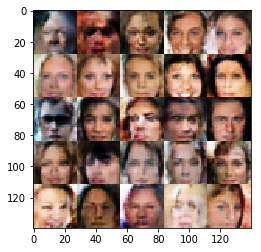

Epoch 1/1... Discriminator Loss: 0.4087... Generator Loss: 1.8828
Epoch 1/1... Discriminator Loss: 0.5628... Generator Loss: 1.1749
Epoch 1/1... Discriminator Loss: 0.6541... Generator Loss: 0.9941
Epoch 1/1... Discriminator Loss: 0.6201... Generator Loss: 1.1264
Epoch 1/1... Discriminator Loss: 0.2792... Generator Loss: 1.7080


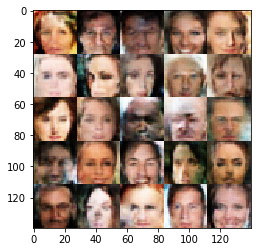

Epoch 1/1... Discriminator Loss: 0.5574... Generator Loss: 1.1712
Epoch 1/1... Discriminator Loss: 0.3254... Generator Loss: 1.5917
Epoch 1/1... Discriminator Loss: 0.2678... Generator Loss: 1.8878
Epoch 1/1... Discriminator Loss: 1.0124... Generator Loss: 0.5706
Epoch 1/1... Discriminator Loss: 0.6319... Generator Loss: 0.9143


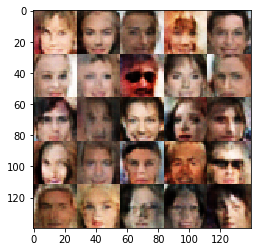

Epoch 1/1... Discriminator Loss: 0.9665... Generator Loss: 0.6154
Epoch 1/1... Discriminator Loss: 0.4370... Generator Loss: 1.3106
Epoch 1/1... Discriminator Loss: 0.8767... Generator Loss: 0.9306
Epoch 1/1... Discriminator Loss: 0.9215... Generator Loss: 0.6093
Epoch 1/1... Discriminator Loss: 0.3713... Generator Loss: 1.6775


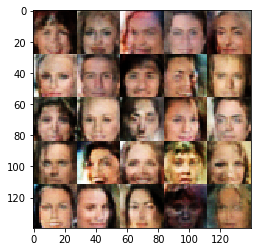

Epoch 1/1... Discriminator Loss: 0.8987... Generator Loss: 0.7630
Epoch 1/1... Discriminator Loss: 0.9890... Generator Loss: 0.5913
Epoch 1/1... Discriminator Loss: 0.5839... Generator Loss: 1.0894
Epoch 1/1... Discriminator Loss: 3.9884... Generator Loss: 7.6210
Epoch 1/1... Discriminator Loss: 0.5559... Generator Loss: 1.1691


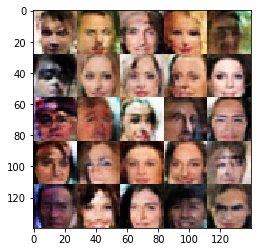

Epoch 1/1... Discriminator Loss: 0.4446... Generator Loss: 1.3788
Epoch 1/1... Discriminator Loss: 0.4019... Generator Loss: 1.8938
Epoch 1/1... Discriminator Loss: 0.6830... Generator Loss: 0.9374
Epoch 1/1... Discriminator Loss: 0.4582... Generator Loss: 1.2973
Epoch 1/1... Discriminator Loss: 1.7247... Generator Loss: 0.2507


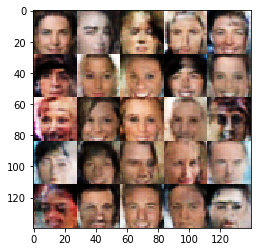

Epoch 1/1... Discriminator Loss: 0.4301... Generator Loss: 1.8613
Epoch 1/1... Discriminator Loss: 0.1565... Generator Loss: 2.6344
Epoch 1/1... Discriminator Loss: 0.4453... Generator Loss: 1.3076
Epoch 1/1... Discriminator Loss: 0.6654... Generator Loss: 0.8869
Epoch 1/1... Discriminator Loss: 0.7846... Generator Loss: 0.8350


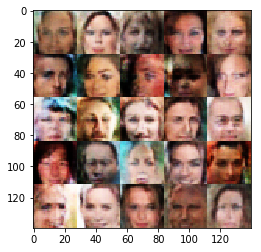

Epoch 1/1... Discriminator Loss: 0.4603... Generator Loss: 1.4067
Epoch 1/1... Discriminator Loss: 0.8063... Generator Loss: 2.6090
Epoch 1/1... Discriminator Loss: 0.5894... Generator Loss: 1.1772
Epoch 1/1... Discriminator Loss: 0.3946... Generator Loss: 1.7281
Epoch 1/1... Discriminator Loss: 0.2142... Generator Loss: 2.6834


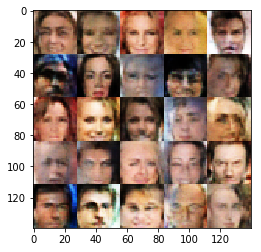

Epoch 1/1... Discriminator Loss: 0.8174... Generator Loss: 0.7538
Epoch 1/1... Discriminator Loss: 0.2806... Generator Loss: 1.8805
Epoch 1/1... Discriminator Loss: 0.2582... Generator Loss: 1.8049
Epoch 1/1... Discriminator Loss: 0.1448... Generator Loss: 2.7050
Epoch 1/1... Discriminator Loss: 0.2280... Generator Loss: 1.9498


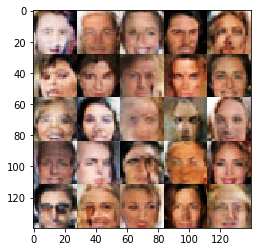

Epoch 1/1... Discriminator Loss: 0.9712... Generator Loss: 4.1311
Epoch 1/1... Discriminator Loss: 0.7258... Generator Loss: 0.8748
Epoch 1/1... Discriminator Loss: 0.4004... Generator Loss: 1.5537
Epoch 1/1... Discriminator Loss: 0.6506... Generator Loss: 1.0703
Epoch 1/1... Discriminator Loss: 0.4771... Generator Loss: 1.2721


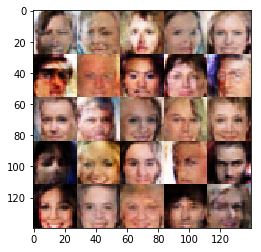

Epoch 1/1... Discriminator Loss: 0.5086... Generator Loss: 1.1997
Epoch 1/1... Discriminator Loss: 0.3610... Generator Loss: 1.7296
Epoch 1/1... Discriminator Loss: 0.7878... Generator Loss: 0.7443
Epoch 1/1... Discriminator Loss: 2.5891... Generator Loss: 0.1680
Epoch 1/1... Discriminator Loss: 0.2913... Generator Loss: 1.6883


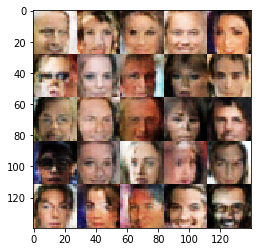

Epoch 1/1... Discriminator Loss: 0.6096... Generator Loss: 1.1517
Epoch 1/1... Discriminator Loss: 0.3412... Generator Loss: 1.8730
Epoch 1/1... Discriminator Loss: 0.7993... Generator Loss: 0.8051
Epoch 1/1... Discriminator Loss: 0.7170... Generator Loss: 0.8362
Epoch 1/1... Discriminator Loss: 1.5341... Generator Loss: 0.3250


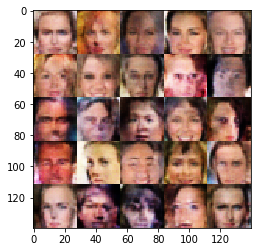

Epoch 1/1... Discriminator Loss: 0.5131... Generator Loss: 1.1606
Epoch 1/1... Discriminator Loss: 0.4653... Generator Loss: 1.2962
Epoch 1/1... Discriminator Loss: 0.4935... Generator Loss: 1.1158
Epoch 1/1... Discriminator Loss: 0.3756... Generator Loss: 1.6711
Epoch 1/1... Discriminator Loss: 0.8556... Generator Loss: 0.7796


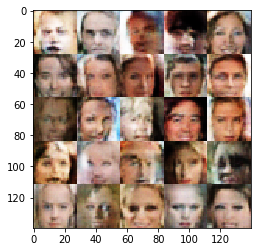

Epoch 1/1... Discriminator Loss: 0.8668... Generator Loss: 0.7563
Epoch 1/1... Discriminator Loss: 1.1941... Generator Loss: 0.5104
Epoch 1/1... Discriminator Loss: 0.3967... Generator Loss: 1.4756
Epoch 1/1... Discriminator Loss: 0.4277... Generator Loss: 1.5614
Epoch 1/1... Discriminator Loss: 0.5500... Generator Loss: 1.2300


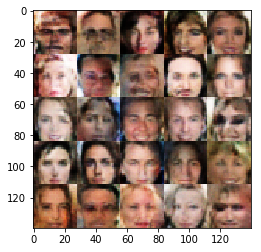

Epoch 1/1... Discriminator Loss: 0.7558... Generator Loss: 0.9026
Epoch 1/1... Discriminator Loss: 1.2744... Generator Loss: 0.4537
Epoch 1/1... Discriminator Loss: 0.2234... Generator Loss: 2.3239
Epoch 1/1... Discriminator Loss: 0.4634... Generator Loss: 1.3082
Epoch 1/1... Discriminator Loss: 0.6312... Generator Loss: 1.0741


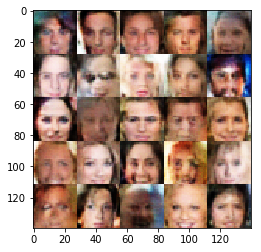

Epoch 1/1... Discriminator Loss: 1.0166... Generator Loss: 0.5506
Epoch 1/1... Discriminator Loss: 1.5796... Generator Loss: 0.3003
Epoch 1/1... Discriminator Loss: 0.4742... Generator Loss: 1.2020
Epoch 1/1... Discriminator Loss: 0.4354... Generator Loss: 2.1348
Epoch 1/1... Discriminator Loss: 0.7022... Generator Loss: 1.0414


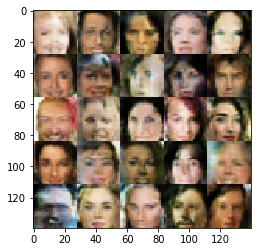

Epoch 1/1... Discriminator Loss: 0.6422... Generator Loss: 1.0176
Epoch 1/1... Discriminator Loss: 0.9528... Generator Loss: 0.5782
Epoch 1/1... Discriminator Loss: 0.5412... Generator Loss: 1.1298
Epoch 1/1... Discriminator Loss: 0.2369... Generator Loss: 2.9600
Epoch 1/1... Discriminator Loss: 0.3893... Generator Loss: 1.7922


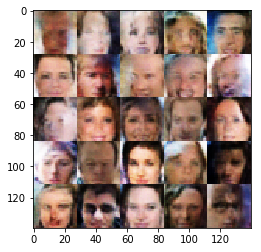

Epoch 1/1... Discriminator Loss: 1.1411... Generator Loss: 0.4794
Epoch 1/1... Discriminator Loss: 0.9586... Generator Loss: 0.6077
Epoch 1/1... Discriminator Loss: 0.5423... Generator Loss: 1.3592
Epoch 1/1... Discriminator Loss: 0.3287... Generator Loss: 2.6650
Epoch 1/1... Discriminator Loss: 0.4343... Generator Loss: 1.4091


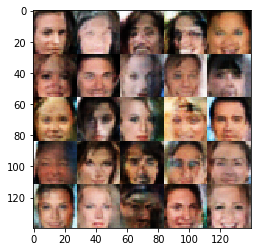

Epoch 1/1... Discriminator Loss: 0.2482... Generator Loss: 1.9135
Epoch 1/1... Discriminator Loss: 0.6206... Generator Loss: 1.0939
Epoch 1/1... Discriminator Loss: 1.3126... Generator Loss: 0.4715
Epoch 1/1... Discriminator Loss: 0.5477... Generator Loss: 1.8916
Epoch 1/1... Discriminator Loss: 0.6458... Generator Loss: 1.0593


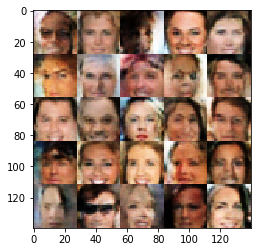

Epoch 1/1... Discriminator Loss: 1.4184... Generator Loss: 0.3959
Epoch 1/1... Discriminator Loss: 0.5468... Generator Loss: 1.0896
Epoch 1/1... Discriminator Loss: 0.5099... Generator Loss: 2.4009
Epoch 1/1... Discriminator Loss: 0.7746... Generator Loss: 0.9065
Epoch 1/1... Discriminator Loss: 0.6149... Generator Loss: 1.1859


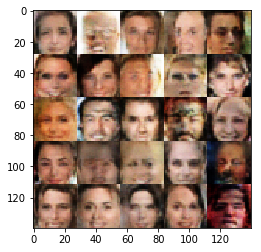

Epoch 1/1... Discriminator Loss: 0.2404... Generator Loss: 1.8303
Epoch 1/1... Discriminator Loss: 0.8054... Generator Loss: 0.7413
Epoch 1/1... Discriminator Loss: 0.6127... Generator Loss: 1.0916
Epoch 1/1... Discriminator Loss: 0.3932... Generator Loss: 1.4442
Epoch 1/1... Discriminator Loss: 0.4616... Generator Loss: 1.3557


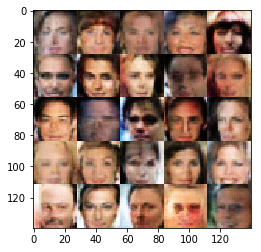

Epoch 1/1... Discriminator Loss: 0.4445... Generator Loss: 1.3154
Epoch 1/1... Discriminator Loss: 0.3997... Generator Loss: 1.7196
Epoch 1/1... Discriminator Loss: 1.1187... Generator Loss: 0.5566
Epoch 1/1... Discriminator Loss: 0.6563... Generator Loss: 0.9452
Epoch 1/1... Discriminator Loss: 0.5780... Generator Loss: 1.0628


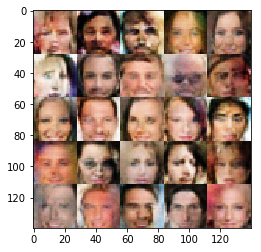

Epoch 1/1... Discriminator Loss: 0.5152... Generator Loss: 1.1919
Epoch 1/1... Discriminator Loss: 0.4878... Generator Loss: 1.1559
Epoch 1/1... Discriminator Loss: 0.9740... Generator Loss: 0.5908
Epoch 1/1... Discriminator Loss: 0.9828... Generator Loss: 0.6186
Epoch 1/1... Discriminator Loss: 1.2523... Generator Loss: 0.5074


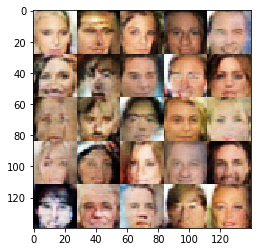

Epoch 1/1... Discriminator Loss: 0.6293... Generator Loss: 1.1600
Epoch 1/1... Discriminator Loss: 0.2231... Generator Loss: 2.0014
Epoch 1/1... Discriminator Loss: 0.5373... Generator Loss: 1.2118
Epoch 1/1... Discriminator Loss: 1.6405... Generator Loss: 0.2961
Epoch 1/1... Discriminator Loss: 0.6266... Generator Loss: 1.0556


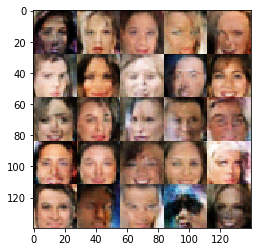

Epoch 1/1... Discriminator Loss: 0.5486... Generator Loss: 1.2225
Epoch 1/1... Discriminator Loss: 0.4995... Generator Loss: 1.2930
Epoch 1/1... Discriminator Loss: 0.4520... Generator Loss: 2.7476
Epoch 1/1... Discriminator Loss: 1.1802... Generator Loss: 0.4725
Epoch 1/1... Discriminator Loss: 0.2457... Generator Loss: 2.0492


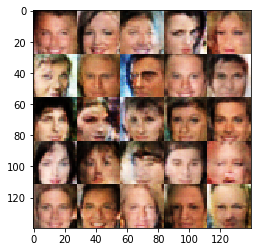

Epoch 1/1... Discriminator Loss: 0.7034... Generator Loss: 0.8872
Epoch 1/1... Discriminator Loss: 0.3298... Generator Loss: 2.6609
Epoch 1/1... Discriminator Loss: 0.4076... Generator Loss: 2.2369
Epoch 1/1... Discriminator Loss: 0.4346... Generator Loss: 1.6738
Epoch 1/1... Discriminator Loss: 0.5976... Generator Loss: 1.1018


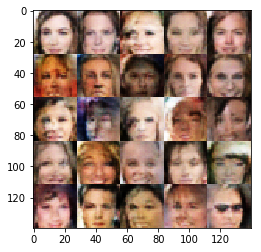

Epoch 1/1... Discriminator Loss: 0.9556... Generator Loss: 0.6199
Epoch 1/1... Discriminator Loss: 0.6997... Generator Loss: 0.9223
Epoch 1/1... Discriminator Loss: 1.5391... Generator Loss: 0.3407
Epoch 1/1... Discriminator Loss: 0.5239... Generator Loss: 1.2631
Epoch 1/1... Discriminator Loss: 0.7574... Generator Loss: 0.9920


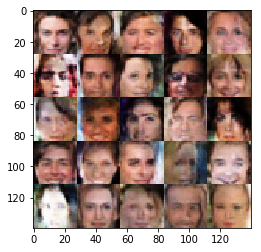

Epoch 1/1... Discriminator Loss: 1.2022... Generator Loss: 0.4852
Epoch 1/1... Discriminator Loss: 0.9526... Generator Loss: 0.6130
Epoch 1/1... Discriminator Loss: 1.1471... Generator Loss: 0.5289
Epoch 1/1... Discriminator Loss: 0.8232... Generator Loss: 0.8145
Epoch 1/1... Discriminator Loss: 0.8558... Generator Loss: 0.7708


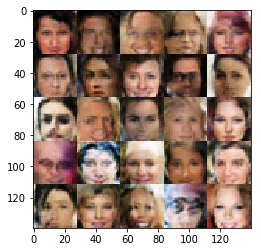

Epoch 1/1... Discriminator Loss: 0.6345... Generator Loss: 1.0394
Epoch 1/1... Discriminator Loss: 0.2612... Generator Loss: 2.1157
Epoch 1/1... Discriminator Loss: 0.4586... Generator Loss: 1.8927
Epoch 1/1... Discriminator Loss: 0.4288... Generator Loss: 1.3080
Epoch 1/1... Discriminator Loss: 0.5697... Generator Loss: 1.2196


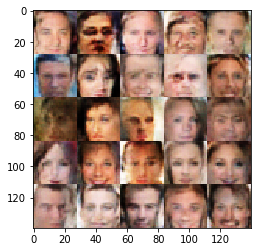

Epoch 1/1... Discriminator Loss: 1.2147... Generator Loss: 0.4359
Epoch 1/1... Discriminator Loss: 0.8619... Generator Loss: 0.6845
Epoch 1/1... Discriminator Loss: 0.4596... Generator Loss: 1.3175
Epoch 1/1... Discriminator Loss: 0.4183... Generator Loss: 2.5722
Epoch 1/1... Discriminator Loss: 1.1949... Generator Loss: 0.4889


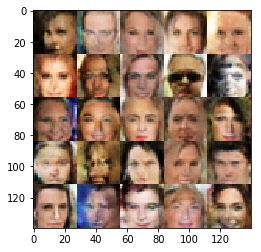

Epoch 1/1... Discriminator Loss: 1.0282... Generator Loss: 0.6107
Epoch 1/1... Discriminator Loss: 0.4278... Generator Loss: 1.3547
Epoch 1/1... Discriminator Loss: 0.5839... Generator Loss: 1.0488
Epoch 1/1... Discriminator Loss: 0.8500... Generator Loss: 0.6868
Epoch 1/1... Discriminator Loss: 0.4697... Generator Loss: 1.3200


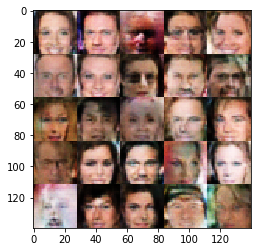

Epoch 1/1... Discriminator Loss: 0.8168... Generator Loss: 0.8065
Epoch 1/1... Discriminator Loss: 0.2682... Generator Loss: 1.8952
Epoch 1/1... Discriminator Loss: 1.4556... Generator Loss: 0.3739
Epoch 1/1... Discriminator Loss: 0.8862... Generator Loss: 4.3133
Epoch 1/1... Discriminator Loss: 1.0542... Generator Loss: 0.6345


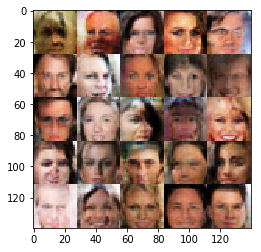

Epoch 1/1... Discriminator Loss: 1.0871... Generator Loss: 0.6120
Epoch 1/1... Discriminator Loss: 0.5342... Generator Loss: 1.1992
Epoch 1/1... Discriminator Loss: 0.3222... Generator Loss: 3.5636
Epoch 1/1... Discriminator Loss: 1.3544... Generator Loss: 0.3765
Epoch 1/1... Discriminator Loss: 1.0221... Generator Loss: 0.6484


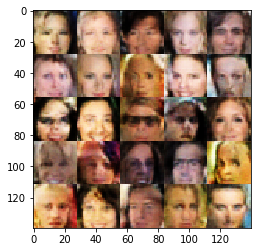

Epoch 1/1... Discriminator Loss: 0.4782... Generator Loss: 1.0934
Epoch 1/1... Discriminator Loss: 1.0427... Generator Loss: 0.5083
Epoch 1/1... Discriminator Loss: 1.2141... Generator Loss: 0.4713
Epoch 1/1... Discriminator Loss: 0.2680... Generator Loss: 1.6588
Epoch 1/1... Discriminator Loss: 0.5339... Generator Loss: 1.1536


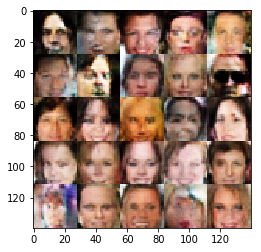

Epoch 1/1... Discriminator Loss: 0.4500... Generator Loss: 1.4192
Epoch 1/1... Discriminator Loss: 1.7120... Generator Loss: 0.2761
Epoch 1/1... Discriminator Loss: 0.3315... Generator Loss: 1.7497
Epoch 1/1... Discriminator Loss: 0.3459... Generator Loss: 2.1361
Epoch 1/1... Discriminator Loss: 0.3939... Generator Loss: 1.5037


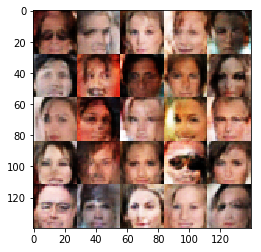

Epoch 1/1... Discriminator Loss: 0.5088... Generator Loss: 1.3134
Epoch 1/1... Discriminator Loss: 0.5301... Generator Loss: 1.2671
Epoch 1/1... Discriminator Loss: 0.2187... Generator Loss: 2.1162
Epoch 1/1... Discriminator Loss: 0.8006... Generator Loss: 0.7542
Epoch 1/1... Discriminator Loss: 0.4285... Generator Loss: 1.8899


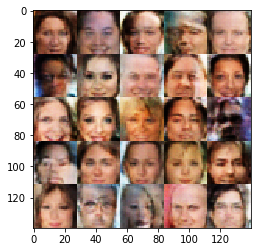

Epoch 1/1... Discriminator Loss: 1.3271... Generator Loss: 0.4080
Epoch 1/1... Discriminator Loss: 0.5868... Generator Loss: 1.1376
Epoch 1/1... Discriminator Loss: 0.6086... Generator Loss: 1.0123
Epoch 1/1... Discriminator Loss: 0.5689... Generator Loss: 3.4101
Epoch 1/1... Discriminator Loss: 0.4296... Generator Loss: 1.3427


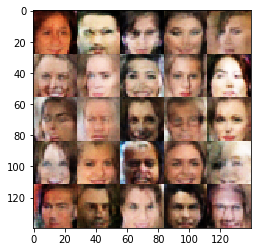

Epoch 1/1... Discriminator Loss: 0.5729... Generator Loss: 1.3103
Epoch 1/1... Discriminator Loss: 0.3991... Generator Loss: 1.4934
Epoch 1/1... Discriminator Loss: 2.3730... Generator Loss: 0.1521
Epoch 1/1... Discriminator Loss: 0.9896... Generator Loss: 0.6490
Epoch 1/1... Discriminator Loss: 0.8641... Generator Loss: 0.6991


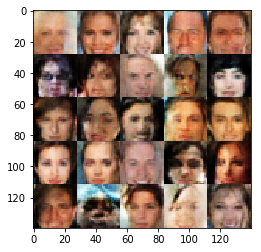

Epoch 1/1... Discriminator Loss: 1.7337... Generator Loss: 0.2583
Epoch 1/1... Discriminator Loss: 0.7369... Generator Loss: 0.9768
Epoch 1/1... Discriminator Loss: 0.7531... Generator Loss: 3.6764
Epoch 1/1... Discriminator Loss: 0.8982... Generator Loss: 0.7826
Epoch 1/1... Discriminator Loss: 0.5697... Generator Loss: 1.1174


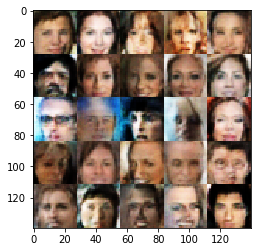

Epoch 1/1... Discriminator Loss: 0.8336... Generator Loss: 0.6788
Epoch 1/1... Discriminator Loss: 0.4720... Generator Loss: 1.3022
Epoch 1/1... Discriminator Loss: 0.1785... Generator Loss: 2.2406
Epoch 1/1... Discriminator Loss: 1.1001... Generator Loss: 0.5076
Epoch 1/1... Discriminator Loss: 0.5904... Generator Loss: 1.3890


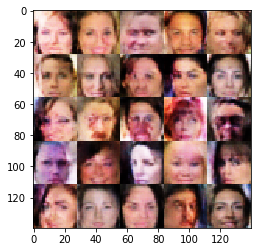

Epoch 1/1... Discriminator Loss: 0.8872... Generator Loss: 0.7588
Epoch 1/1... Discriminator Loss: 0.7821... Generator Loss: 0.8700
Epoch 1/1... Discriminator Loss: 0.4251... Generator Loss: 1.4171
Epoch 1/1... Discriminator Loss: 0.5811... Generator Loss: 1.0159
Epoch 1/1... Discriminator Loss: 1.2234... Generator Loss: 0.4577


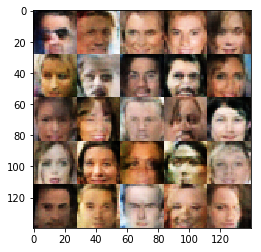

Epoch 1/1... Discriminator Loss: 0.8669... Generator Loss: 0.7276
Epoch 1/1... Discriminator Loss: 0.7282... Generator Loss: 0.8277
Epoch 1/1... Discriminator Loss: 0.3867... Generator Loss: 1.6267
Epoch 1/1... Discriminator Loss: 0.2820... Generator Loss: 1.7014
Epoch 1/1... Discriminator Loss: 0.9935... Generator Loss: 0.5624


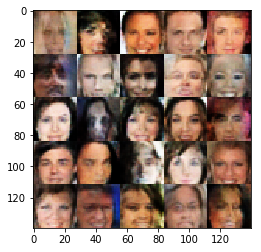

Epoch 1/1... Discriminator Loss: 0.7534... Generator Loss: 0.8608
Epoch 1/1... Discriminator Loss: 0.3265... Generator Loss: 1.6527
Epoch 1/1... Discriminator Loss: 0.2905... Generator Loss: 2.1277
Epoch 1/1... Discriminator Loss: 1.1372... Generator Loss: 0.5616
Epoch 1/1... Discriminator Loss: 1.1287... Generator Loss: 0.5145


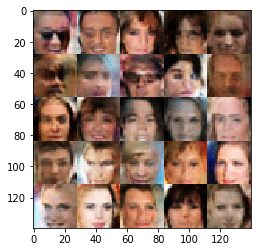

Epoch 1/1... Discriminator Loss: 0.3862... Generator Loss: 1.3988
Epoch 1/1... Discriminator Loss: 0.3967... Generator Loss: 1.6352
Epoch 1/1... Discriminator Loss: 0.7924... Generator Loss: 0.8237


In [133]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.